# Adel Movahedian 400102074

## 1.data preparation and preprocess

In [7]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ayushspai/sportsmot")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/sportsmot


In [20]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("theoviel/soccernet-tracking")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/soccernet-tracking


In [8]:
import os
import cv2
import torch
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

DATA_ROOT = "/kaggle/input/sportsmot/sportsmot_publish/dataset"
TRAIN_DIR = os.path.join(DATA_ROOT, "train")
VAL_DIR = os.path.join(DATA_ROOT, "val")

class SportsMOTDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.sequences = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]

        self.samples = []
        for seq in self.sequences:
            seq_path = os.path.join(root_dir, seq)
            img_dir = os.path.join(seq_path, "img1")
            gt_file = os.path.join(seq_path, "gt", "gt.txt")

            try:
                annotations = pd.read_csv(
                    gt_file, header=None,
                    names=['frame', 'id', 'x', 'y', 'w', 'h', 'conf', 'cls', 'vis']
                )
                annotations = annotations[annotations['cls'] == 1]
            except FileNotFoundError:
                print(f"Error : Annotation file not found for sequence: {seq}")
                continue

            frame_files = sorted([
                f for f in os.listdir(img_dir)
                if f.endswith('.jpg') and f.split('.')[0].isdigit()
            ])

            for frame_file in frame_files:
                frame_num = int(frame_file.split('.')[0])
                frame_anns = annotations[annotations['frame'] == frame_num]
                self.samples.append({
                    'image_path': os.path.join(img_dir, frame_file),
                    'annotations': frame_anns
                })

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]
        image = cv2.imread(sample['image_path'])
        if image is None:
            raise ValueError(f"Failed to load image: {sample['image_path']}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        anns = sample['annotations']
        boxes = anns[['x', 'y', 'w', 'h']].values.astype(float)
        player_ids = anns['id'].values.astype(int)  # Extract player IDs
    
        boxes[:, 2:] += boxes[:, :2]  # Convert to [x1, y1, x2, y2] format
    
        orig_height, orig_width, _ = image.shape
    
        if self.transform:
            transformed_image = self.transform(image)  # Apply transformation
            new_height, new_width = transformed_image.shape[1], transformed_image.shape[2]
            scale_x, scale_y = new_width / orig_width, new_height / orig_height
            boxes[:, [0, 2]] *= scale_x
            boxes[:, [1, 3]] *= scale_y
    
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.ones((len(anns),), dtype=torch.int64)
    
        return transformed_image, {
            'boxes': boxes,
            'labels': labels,
            'player_ids': torch.as_tensor(player_ids, dtype=torch.int64),
            'image_id': torch.tensor([idx]),
            'area': (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]),
            'iscrowd': torch.zeros((len(anns),), dtype=torch.int64)
        }

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
    ], p=0.5),  # 50% chance of applying ColorJitter
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization
])

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((720, 1280)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = SportsMOTDataset(TRAIN_DIR, transform=train_transform)
val_dataset = SportsMOTDataset(VAL_DIR, transform=transform)

def collate_fn(batch):
    return tuple(zip(*batch))

BATCH_SIZE = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)
print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
for images, targets in train_loader:
    print(f"Batch size: {len(images)}")
    print(f"Image shape: {images[0].shape}")
    print(f"Target keys: {targets[0].keys()}")
    break


Train samples: 28574
Validation samples: 26970
Batch size: 4
Image shape: torch.Size([3, 720, 1280])
Target keys: dict_keys(['boxes', 'labels', 'player_ids', 'image_id', 'area', 'iscrowd'])


## visulaization of data

Batch 1:


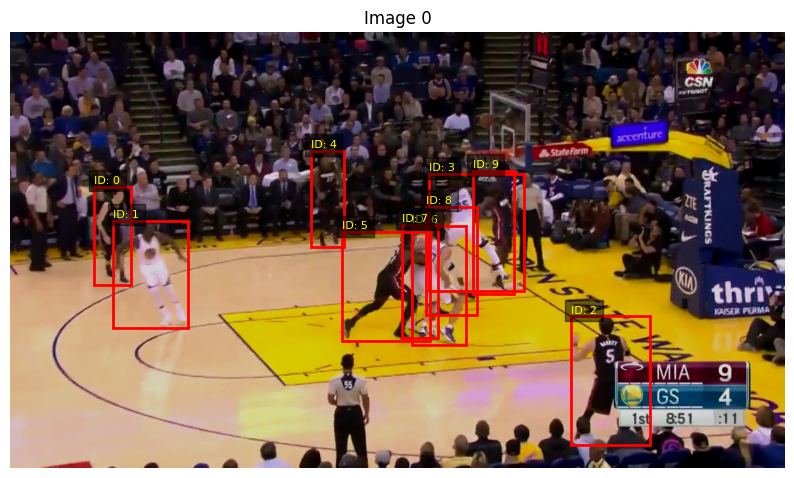

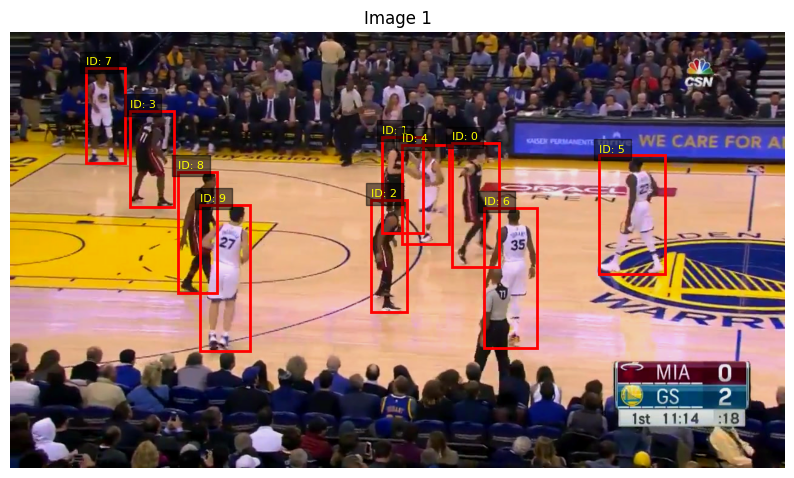

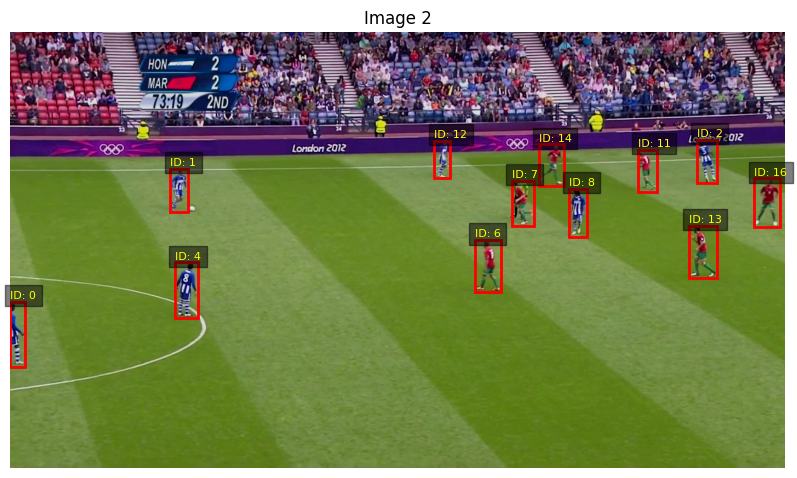

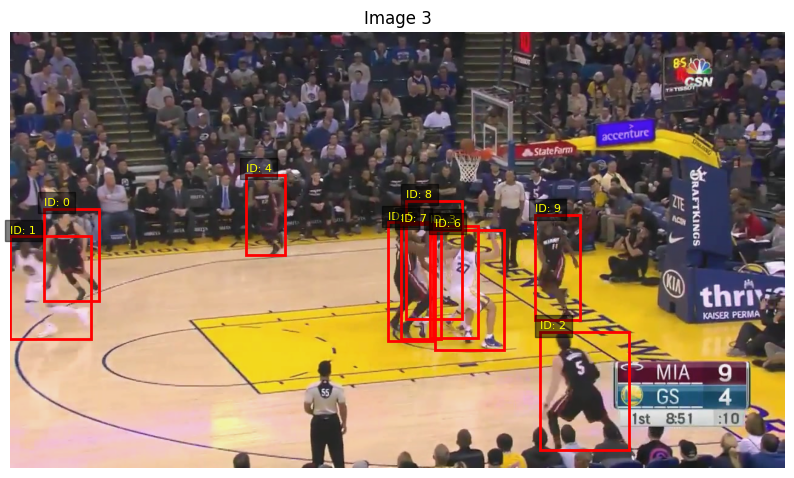

Batch 2:


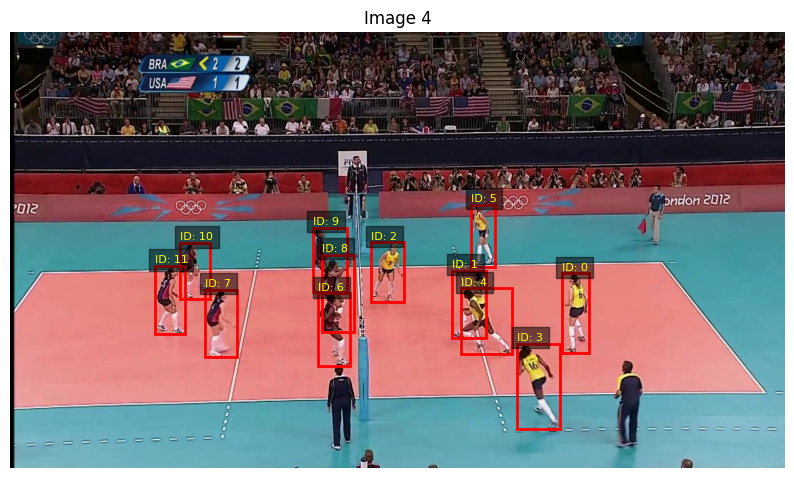

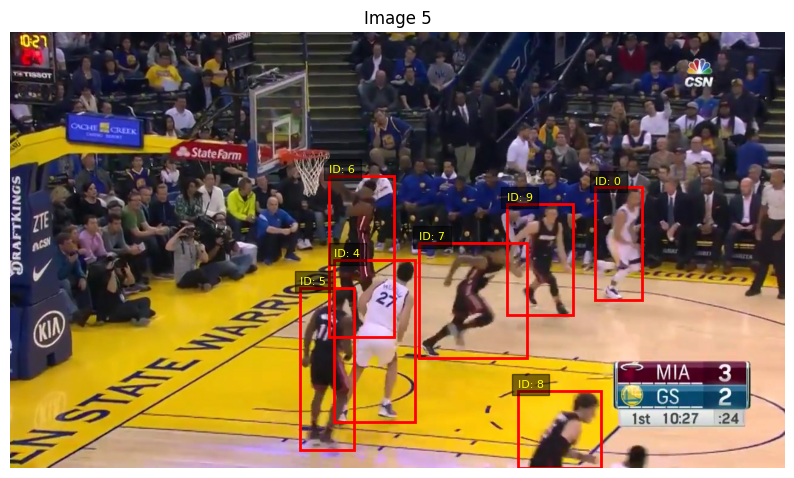

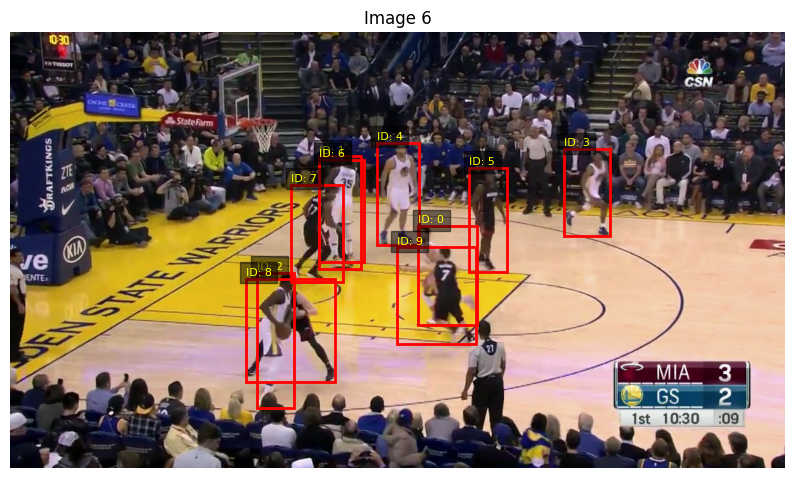

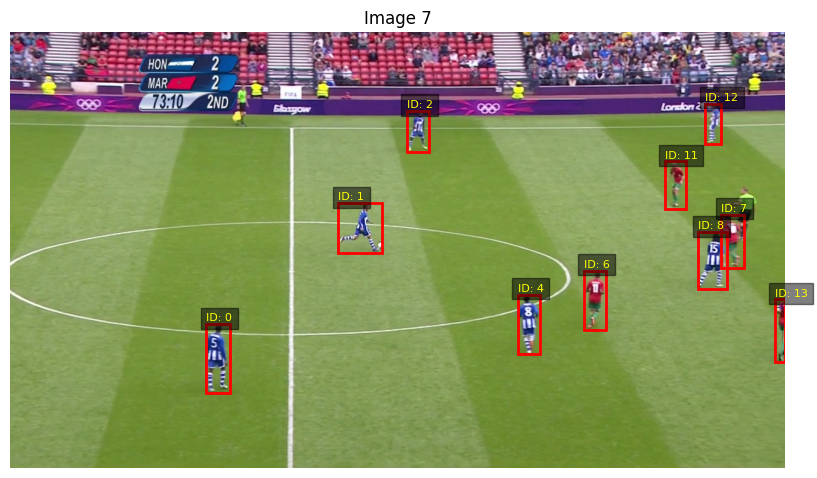

Batch 3:


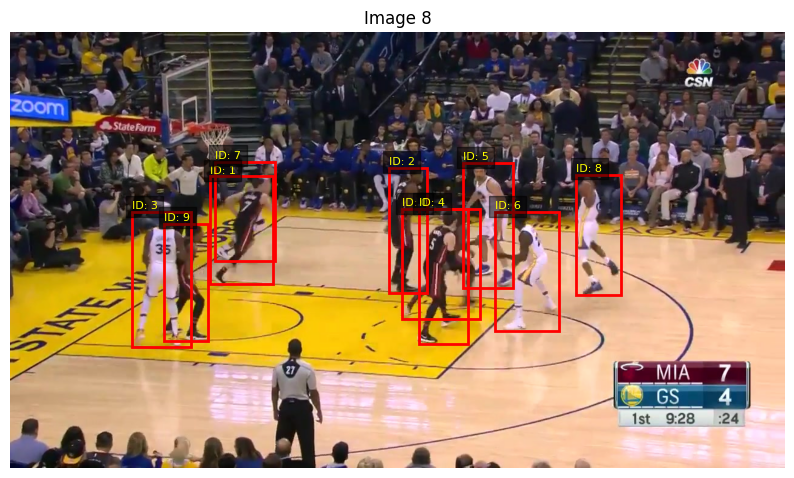

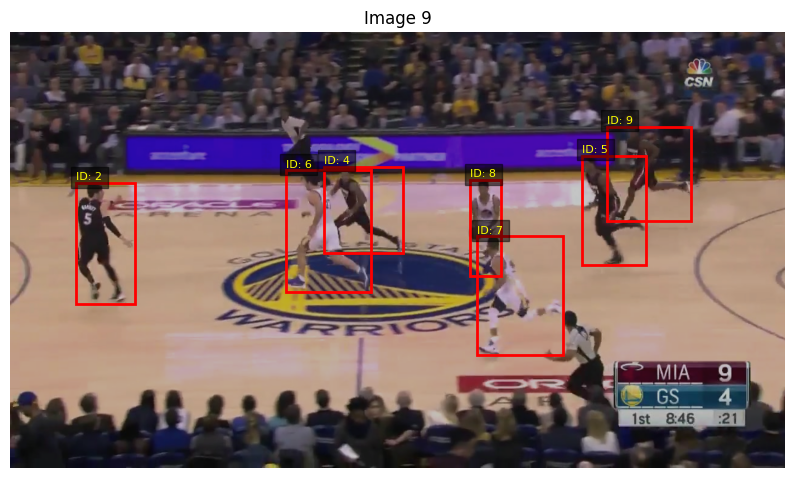

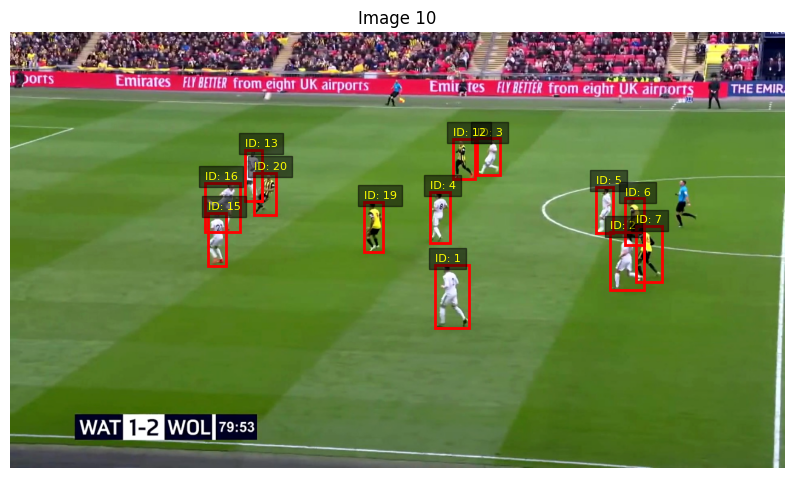

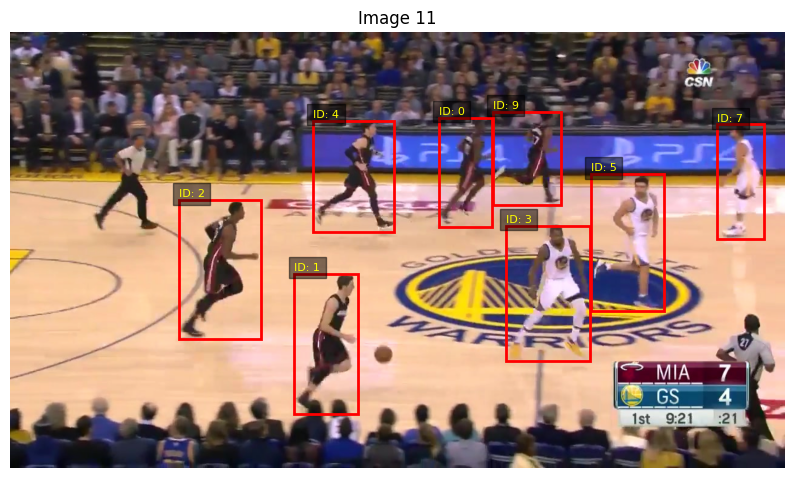

Batch 4:


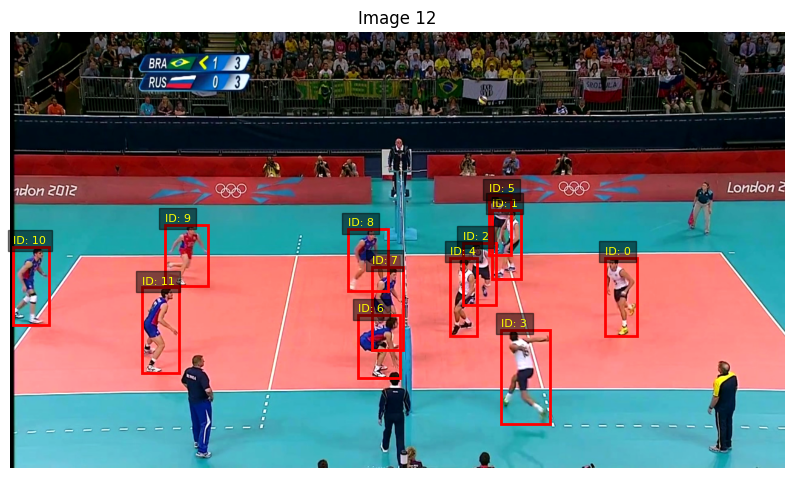

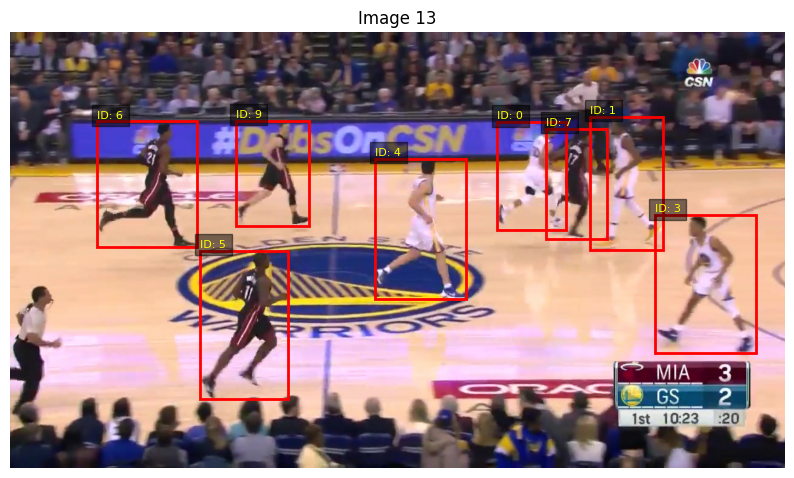

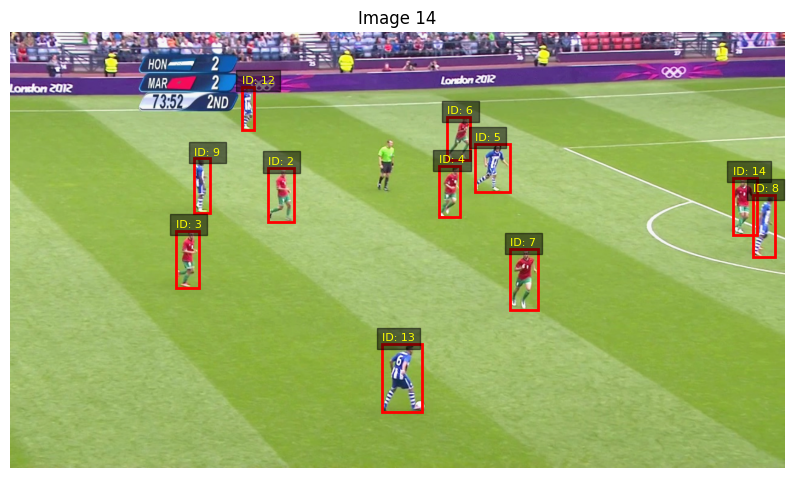

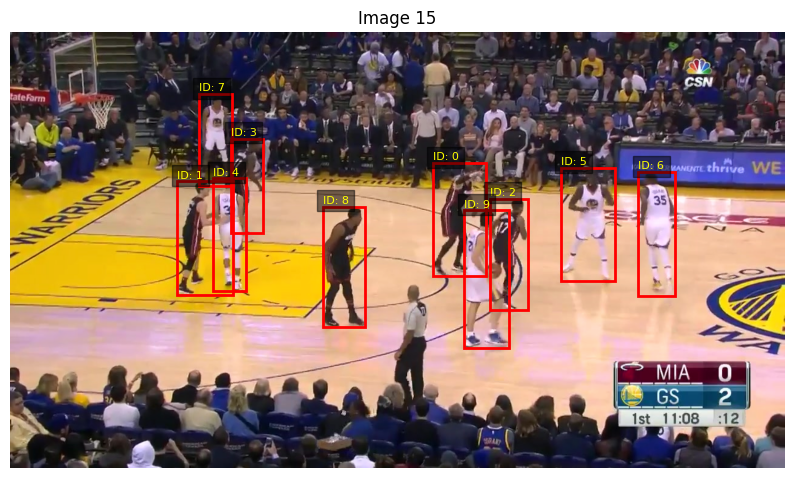

Batch 5:


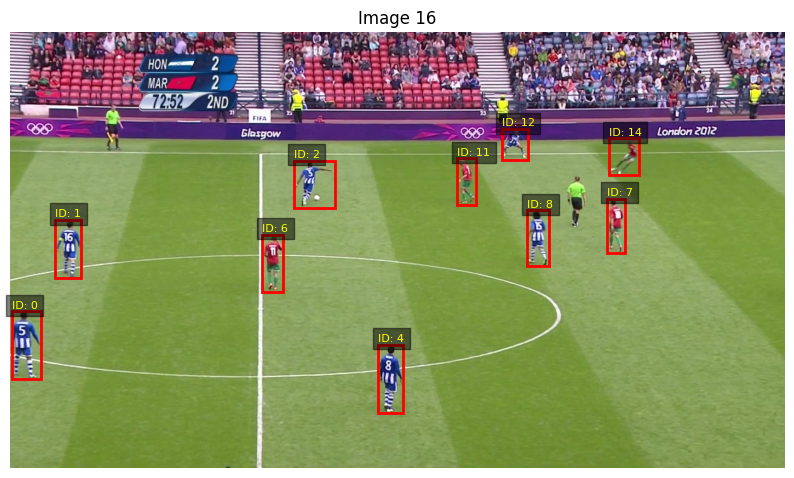

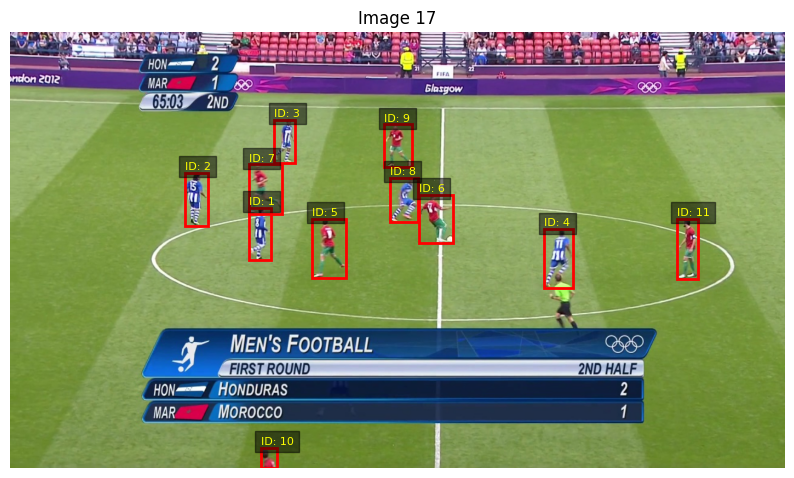

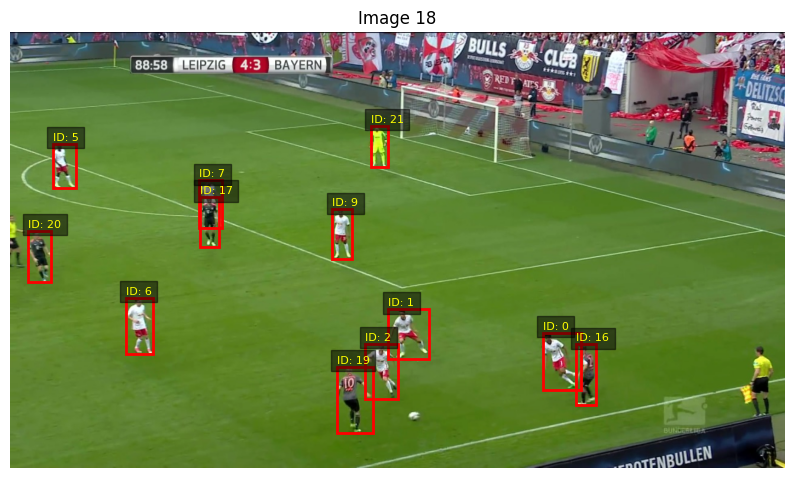

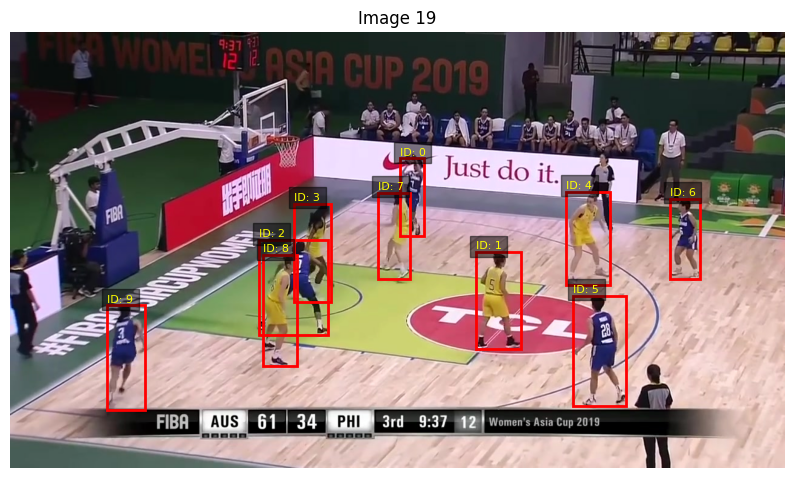

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_images_with_boxes(images, targets, idx_offset=0):
    for i, (image, target) in enumerate(zip(images, targets)):
        img = image.permute(1, 2, 0).numpy()  # Change dimensions to H x W x C
        img = img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Un-normalise
        img = (img * 255).astype('uint8')
        
        fig, ax = plt.subplots(1, 1, figsize=(10, 6))
        ax.imshow(img)
        ax.set_title(f"Image {i + idx_offset}")

        boxes = target['boxes'].cpu().numpy()
        player_ids = target.get('player_ids', torch.tensor([])).cpu().numpy()
        
        for j, box in enumerate(boxes):
            x1, y1, x2, y2 = box
            width, height = x2 - x1, y2 - y1
            rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            if len(player_ids) > j:
                player_id = player_ids[j]
                ax.text(x1, y1 - 5, f"ID: {player_id}", color='yellow', fontsize=8, bbox=dict(facecolor='black', alpha=0.5))
        plt.axis('off')
        plt.show()

for idx, (images, targets) in enumerate(train_loader):
    print(f"Batch {idx + 1}:")
    plot_images_with_boxes(images, targets, idx_offset=idx * len(images))
    if idx > 3 :
        break

## 2.1 Object Detection

### Why YOLO for Object Detection in SportsMOT?

For the SportsMOT, we’ve chosen **YOLO (You Only Look Once)** over Faster R-CNN due to its superior speed and suitability for real-time applications. Sports analytics often involves processing videos with rapid player movements and fast-paced action, making speed a critical factor. YOLO is designed to process images in a single pass through the network, achieving high frame rates while maintaining good accuracy, which is essential for tasks like tracking players and detecting balls in real time.

---

### How YOLO Works

YOLO simplifies object detection by dividing the input image into a grid and predicting bounding boxes and class probabilities for each grid cell simultaneously. Its key advantages include:

1. **Real-Time Performance**: 
   Unlike Faster R-CNN, which uses a two-stage approach involving region proposals and classification, YOLO directly predicts objects in one step. This single-shot process makes it significantly faster, capable of processing dozens of frames per second.

2. **Global Context**:
   YOLO processes the entire image at once, allowing it to learn the global context of objects and their surroundings. This reduces errors like misidentifying overlapping objects, which is common in crowded sports scenes.

3. **Efficiency for Multiple Objects**:
   YOLO excels at detecting multiple objects of different sizes and positions in a single image, making it well-suited for detecting players and balls simultaneously.

---

### Why YOLO is Better than Faster R-CNN for SportsMOT

1. **Speed**: Faster R-CNN, while accurate, uses a region proposal network (RPN) and a separate classifier, making it slower and unsuitable for real-time video analysis. YOLO’s single-pass architecture processes images much faster, making it ideal for live sports scenarios.

2. **Ease of Deployment**: YOLO is easier to deploy on lower-end hardware or edge devices without compromising much on performance. Faster R-CNN typically requires more computational power, which might limit its use in real-time applications.

3. **Real-Time Suitability**: In sports, detecting and tracking players and balls frame-by-frame without delays is critical. YOLO’s ability to process frames at high speed ensures smoother integration with tracking algorithms.

4. **Scalability**: Modern YOLO versions (YOLOv5, YOLOv8) are optimised for a wide range of use cases, providing pre-trained weights and support for training custom datasets, which accelerates development.

---

### Summation

For this project, YOLO offers the best balance of speed, accuracy, and flexibility. Its ability to handle multiple objects in real time makes it a better fit than Faster R-CNN, which, while accurate, is slower and more computationally intensive. YOLO’s advantages align perfectly with the needs of sports analytics, where quick, reliable detection forms the foundation for effective tracking and analysis.

In [11]:
import os
import torch
from PIL import Image
from torch.utils.data import Subset

def convert_annotations_to_yolo(dataset, output_dir, device='cpu'):
    os.makedirs(output_dir, exist_ok=True)
    if isinstance(dataset, Subset):
        original_dataset = dataset.dataset
        indices = dataset.indices
    else:
        original_dataset = dataset
        indices = range(len(original_dataset))
    
    name_counter = {}  # Track occurrences of each base filename

    for idx in indices:
        image_path = original_dataset.samples[idx]['image_path']
        _, target = original_dataset[idx]
        
        # Extract original image name and convert to annotation filename
        original_img_name = os.path.basename(image_path)
        img_base = original_img_name.replace('.jpg', '.txt')
        
        # Handle duplicate filenames
        if img_base in name_counter:
            name_counter[img_base] += 1
            new_img_name = f"{os.path.splitext(img_base)[0]}_{name_counter[img_base]}.txt"
        else:
            name_counter[img_base] = 0  # Initialize counter for this filename
            new_img_name = img_base
        
        annotation_path = os.path.join(output_dir, new_img_name)
        
        # Get image dimensions
        img_width, img_height = Image.open(image_path).size
        
        # Process annotations
        annotations = target['boxes'].to(device)
        labels = target['labels'].to(device)

        yolo_lines = []
        for box in annotations:
            x_min, y_min, x_max, y_max = box
            x_center = ((x_min + x_max) / 2) / img_width
            y_center = ((y_min + y_max) / 2) / img_height
            width = (x_max - x_min) / img_width
            height = (y_max - y_min) / img_height
            
            yolo_lines.append(f"0 {x_center.item()} {y_center.item()} {width.item()} {height.item()}")

        # Write annotation file
        with open(annotation_path, 'w') as f:
            f.write('\n'.join(yolo_lines))

device = 'cuda' if torch.cuda.is_available() else 'cpu'
convert_annotations_to_yolo(train_dataset, "/kaggle/working/train/labels", device=device)
print("Finished converting the train dataset.")

convert_annotations_to_yolo(val_dataset, "/kaggle/working/val/labels", device=device)
print("Finished converting the val dataset.")

Finished converting the train dataset.
Finished converting the val dataset.


In [12]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 29.5 MB/s eta 0:00:00


In [13]:
import shutil
import os

def copy_images_with_counter(samples, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    name_counter = {}
    
    for sample in samples:
        src_path = sample['image_path']
        original_name = os.path.basename(src_path)
        
        # Handle duplicate filenames
        if original_name in name_counter:
            name_counter[original_name] += 1
            base, ext = os.path.splitext(original_name)
            new_name = f"{base}_{name_counter[original_name]}{ext}"
        else:
            name_counter[original_name] = 0  # Initialize counter
            new_name = original_name
        
        dest_path = os.path.join(output_dir, new_name)
        shutil.copy(src_path, dest_path)

# Define paths
train_image_output = "/kaggle/working/train/images"
val_image_output = "/kaggle/working/val/images"

# Copy training images
copy_images_with_counter(train_dataset.samples, train_image_output)
print("Train images copied")

# Copy validation images
copy_images_with_counter(val_dataset.samples, val_image_output)
print("Val images copied")

print("All images copied successfully")

Train images copied
Val images copied
All images copied successfully


In [14]:
import yaml

# Define dataset paths and metadata
dataset = {
    'train': '/kaggle/working/train/images',
    'val': '/kaggle/working/val/images',
    'nc': 1,  # Number of classes
    'names': ['player']  # Class names
}

# Save as dataset.yaml
with open('/kaggle/working/dataset.yaml', 'w') as file:
    yaml.dump(dataset, file)

print("YAML file created successfully!")


YAML file created successfully!


In [15]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

# Train the model
model.train(
    data="/kaggle/working/dataset.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    device=0  # Use GPU
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 193MB/s]

Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/dataset.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

100%|██████████| 755k/755k [00:00<00:00, 49.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 198MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/train/labels... 28574 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28574/28574 [00:58<00:00, 488.15it/s]


train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/val/labels... 26970 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26970/26970 [00:30<00:00, 896.66it/s] 

val: WARNING ⚠️ /kaggle/working/val/images/000201_39.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000216_39.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000220_39.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000230_38.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000240_37.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000326_31.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000348_30.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000351_29.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000353_29.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000456.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000462.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/val/images/000475.jpg: 1 duplicate labe

val: New cache created: /kaggle/working/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.51G      1.146     0.9534     0.9992        330        640: 100%|██████████| 1786/1786 [05:54<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:39<00:00,  5.29it/s]


                   all      26970     295473      0.923      0.917      0.953      0.691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.77G      1.049     0.6432     0.9527        234        640: 100%|██████████| 1786/1786 [05:48<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:34<00:00,  5.47it/s]


                   all      26970     295473      0.932      0.929      0.959      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.68G      1.035     0.5945     0.9513        276        640: 100%|██████████| 1786/1786 [05:43<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:32<00:00,  5.54it/s]


                   all      26970     295473      0.917       0.93      0.946      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.6G     0.9956     0.5517     0.9435        248        640: 100%|██████████| 1786/1786 [05:41<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:28<00:00,  5.67it/s]


                   all      26970     295473      0.939      0.933      0.956      0.735

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.53G     0.9497     0.5145     0.9295        327        640: 100%|██████████| 1786/1786 [05:41<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.70it/s]


                   all      26970     295473      0.939       0.93      0.956      0.746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.45G     0.9207     0.4923     0.9202        419        640: 100%|██████████| 1786/1786 [05:39<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:28<00:00,  5.69it/s]


                   all      26970     295473      0.936      0.941      0.953      0.749

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.52G     0.8968     0.4745     0.9128        338        640: 100%|██████████| 1786/1786 [05:38<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.71it/s]


                   all      26970     295473      0.935      0.944      0.953      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.52G     0.8793     0.4626     0.9089        228        640: 100%|██████████| 1786/1786 [05:38<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.73it/s]


                   all      26970     295473      0.941      0.942      0.958      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.52G     0.8672     0.4533      0.905        253        640: 100%|██████████| 1786/1786 [05:38<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.72it/s]


                   all      26970     295473      0.949      0.942      0.965      0.769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.44G     0.8531     0.4447     0.9006        323        640: 100%|██████████| 1786/1786 [05:38<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.70it/s]


                   all      26970     295473      0.947      0.941       0.96      0.764

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.5G     0.8418     0.4373     0.8982        257        640: 100%|██████████| 1786/1786 [05:37<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:27<00:00,  5.71it/s]


                   all      26970     295473      0.943      0.941      0.957      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       2.5G     0.8328     0.4311     0.8954        287        640: 100%|██████████| 1786/1786 [05:37<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:26<00:00,  5.75it/s]


                   all      26970     295473      0.947      0.943       0.96      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.51G     0.8222     0.4238     0.8916        272        640: 100%|██████████| 1786/1786 [05:36<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:25<00:00,  5.81it/s]


                   all      26970     295473      0.945      0.947      0.961      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       2.5G     0.8157     0.4193     0.8897        329        640: 100%|██████████| 1786/1786 [05:37<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:24<00:00,  5.83it/s]


                   all      26970     295473      0.944      0.944       0.96      0.772

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.52G      0.808     0.4143     0.8881        282        640: 100%|██████████| 1786/1786 [05:37<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.88it/s]


                   all      26970     295473      0.948      0.944      0.963      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.43G     0.7982     0.4083     0.8857        268        640: 100%|██████████| 1786/1786 [05:36<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.88it/s]


                   all      26970     295473      0.948      0.946      0.963       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.45G     0.7907     0.4043     0.8836        311        640: 100%|██████████| 1786/1786 [05:35<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.88it/s]


                   all      26970     295473      0.949      0.946      0.962      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.51G     0.7834     0.3992     0.8817        243        640: 100%|██████████| 1786/1786 [05:35<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.88it/s]


                   all      26970     295473      0.949      0.949      0.962      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.53G     0.7758      0.395     0.8793        366        640: 100%|██████████| 1786/1786 [05:35<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:22<00:00,  5.92it/s]


                   all      26970     295473      0.948      0.948      0.962      0.782

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.45G     0.7699     0.3903     0.8775        267        640: 100%|██████████| 1786/1786 [05:36<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.85it/s]


                   all      26970     295473      0.949      0.948      0.962      0.783
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.36G      0.708     0.3539     0.8625        143        640: 100%|██████████| 1786/1786 [05:30<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:22<00:00,  5.91it/s]


                   all      26970     295473       0.95      0.949      0.963      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.36G     0.7006     0.3503     0.8599        140        640: 100%|██████████| 1786/1786 [05:29<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.87it/s]


                   all      26970     295473       0.95      0.949      0.963      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.36G     0.6909     0.3443     0.8573        147        640: 100%|██████████| 1786/1786 [05:29<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.89it/s]


                   all      26970     295473      0.948      0.948      0.961      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.36G     0.6835     0.3396      0.855        151        640: 100%|██████████| 1786/1786 [05:29<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:23<00:00,  5.88it/s]


                   all      26970     295473      0.949      0.948      0.961      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.36G     0.6753     0.3347     0.8529        151        640: 100%|██████████| 1786/1786 [05:28<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:21<00:00,  5.94it/s]


                   all      26970     295473      0.948      0.948      0.961      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.36G     0.6677     0.3297     0.8506        160        640: 100%|██████████| 1786/1786 [05:27<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:20<00:00,  5.99it/s]


                   all      26970     295473      0.948      0.948       0.96      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.36G     0.6597     0.3246     0.8486        143        640: 100%|██████████| 1786/1786 [05:26<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:20<00:00,  6.00it/s]


                   all      26970     295473      0.948      0.948      0.959      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.36G     0.6526     0.3206     0.8464        153        640: 100%|██████████| 1786/1786 [05:28<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:21<00:00,  5.96it/s]


                   all      26970     295473      0.948      0.947      0.959      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.36G     0.6474     0.3168     0.8445        157        640: 100%|██████████| 1786/1786 [05:27<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:21<00:00,  5.97it/s]


                   all      26970     295473      0.948      0.947      0.959      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.36G     0.6389     0.3119     0.8425        139        640: 100%|██████████| 1786/1786 [05:27<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:21<00:00,  5.95it/s]


                   all      26970     295473      0.948      0.946      0.959      0.783

30 epochs completed in 4.039 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 843/843 [02:58<00:00,  4.72it/s]


                   all      26970     295473       0.95      0.948      0.963      0.786


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79322913b4c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

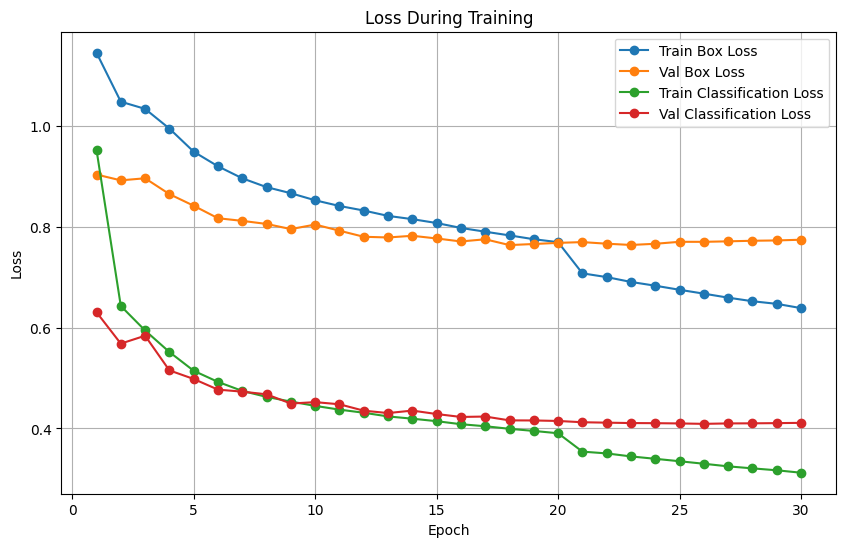

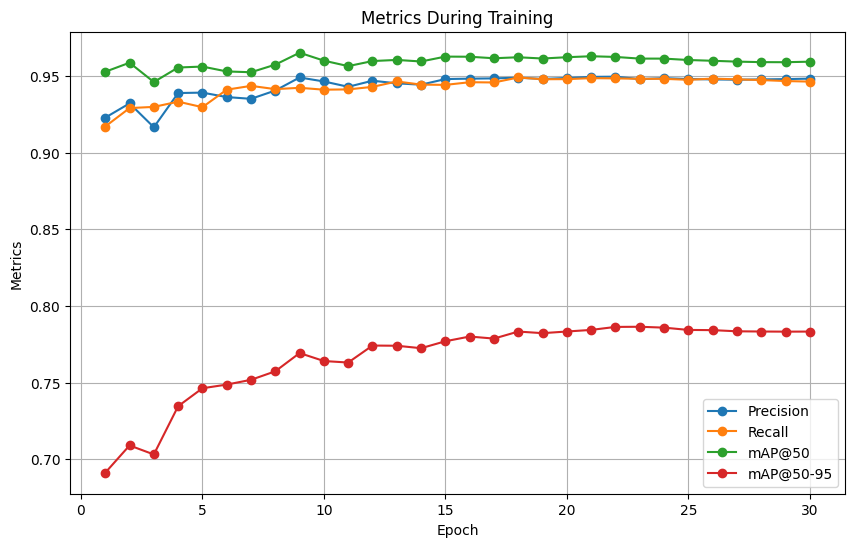

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

results_path = "/kaggle/working/runs/detect/train/results.csv"
data = pd.read_csv(results_path)

plt.figure(figsize=(10, 6))
plt.plot(data['epoch'], data['train/box_loss'], label='Train Box Loss', marker='o')
plt.plot(data['epoch'], data['val/box_loss'], label='Val Box Loss', marker='o')
plt.plot(data['epoch'], data['train/cls_loss'], label='Train Classification Loss', marker='o')
plt.plot(data['epoch'], data['val/cls_loss'], label='Val Classification Loss', marker='o')
plt.title('Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(data['epoch'], data['metrics/precision(B)'], label='Precision', marker='o')
plt.plot(data['epoch'], data['metrics/recall(B)'], label='Recall', marker='o')
plt.plot(data['epoch'], data['metrics/mAP50(B)'], label='mAP@50', marker='o')
plt.plot(data['epoch'], data['metrics/mAP50-95(B)'], label='mAP@50-95', marker='o')
plt.title('Metrics During Training')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.legend()
plt.grid()
plt.show()


## Practical use of object detection yolo model


image 1/1 /kaggle/input/sportsmot/sportsmot_publish/dataset/test/v_1UDUODIBSsc_c090/img1/000006.jpg: 384x640 17 players, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


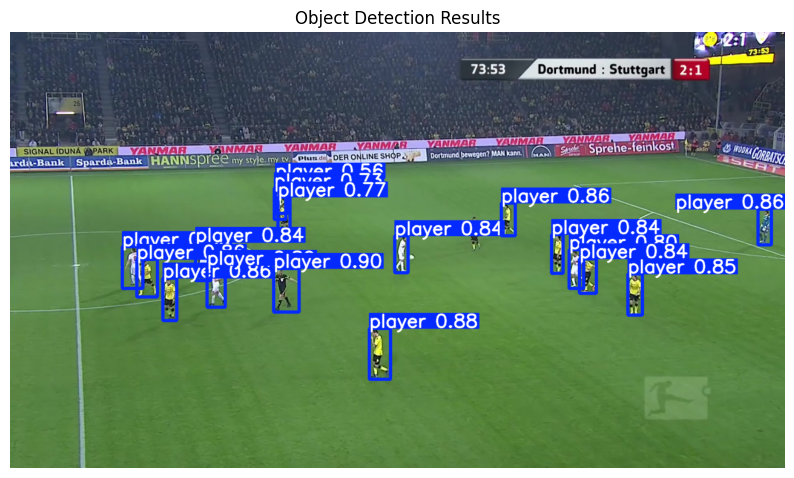

In [27]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

trained_model_path = "/kaggle/working/runs/detect/train/weights/best.pt"
model = YOLO(trained_model_path)
test_image_path = "/kaggle/input/sportsmot/sportsmot_publish/dataset/test/v_1UDUODIBSsc_c090/img1/000006.jpg"  

results = model(test_image_path)

result_image = results[0].plot()

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Object Detection Results")
plt.show()


<font color="green">As we can see in the above example the model is detecting objects(players) very well and has good accuracy in just detecting players and not the referee. In the next code cell I'm gonna probe model performance and accuracy with different metrics.<font>

In [18]:
import os
from ultralytics import YOLO
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np
import warnings
import contextlib
import sys

warnings.filterwarnings("ignore")

model_path = "/kaggle/working/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

def calculate_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection
    if union == 0:
        return 0
    return intersection / union

def evaluate_object_detection(model, dataset, iou_threshold=0.5, num_samples=100):
    y_true = []
    y_pred = []
    iou_scores = []
    num_samples = min(num_samples, len(dataset))

    for idx in range(num_samples):
        #image path and ground truth
        image_path = dataset.samples[idx]['image_path']
        _, target = dataset[idx]
        gt_boxes = target['boxes'].numpy()

        
        with open(os.devnull, 'w') as devnull, contextlib.redirect_stdout(devnull), contextlib.redirect_stderr(devnull):
            results = model(image_path, verbose=False, conf=0.5)  # Confidence threshold

        pred_boxes = results[0].boxes.xyxy.cpu().numpy()

        for gt_box in gt_boxes:
            match_found = False
            for pred_box in pred_boxes:
                iou = calculate_iou(gt_box, pred_box)
                iou_scores.append(iou)
                if iou >= iou_threshold:
                    y_true.append(1)  # True positive
                    y_pred.append(1)
                    match_found = True
                    break
            if not match_found:
                y_true.append(1)  # Ground truth object not detected
                y_pred.append(0)

        #false positives
        for pred_box in pred_boxes:
            if not any(calculate_iou(pred_box, gt_box) >= iou_threshold for gt_box in gt_boxes):
                y_true.append(0)
                y_pred.append(1)

    precision = precision_score(y_true, y_pred, zero_division=1)
    recall = recall_score(y_true, y_pred, zero_division=1)
    f1 = f1_score(y_true, y_pred, zero_division=1)
    mAP = np.mean([iou for iou in iou_scores if iou >= iou_threshold])
    return precision, recall, f1, mAP

precision, recall, f1, mAP = evaluate_object_detection(model, val_dataset, num_samples=100)
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"mAP@{0.5}: {mAP:.4f}")


Precision: 0.9264
Recall: 0.9569
F1 Score: 0.9414
mAP@0.5: 0.8670


# 2.2 Single Object Tracking(SOT)

### Single Object Tracking: Algorithm Selection and Benefits

For the **Single Object Tracking (SOT)** task, we consider two popular algorithms: **CSRT Tracker** and **Siamese Networks**. Below, we outline their features, benefits, and key references.

---

### **1. CSRT Tracker**
**CSRT** stands for **Discriminative Correlation Filter with Channel and Spatial Reliability**. It is a traditional computer vision approach that focuses on efficiently tracking a single object in real-time.

- **Some Benefits**:
  - Real-time performance, suitable for applications with limited computational resources.
  - Robust to partial occlusions and moderately challenging variations (e.g., scale or rotation).
  - Simple implementation using OpenCV.

- **Drawbacks**:
  - May struggle with fast-moving objects or severe occlusions.
  - Limited by handcrafted feature extraction, which cannot match deep learning methods in complex scenarios.
  -   
    [Paper Link](https://openaccess.thecvf.com/content_cvpr_2017/papers/Lukezic_Discriminative_Correlation_Filter_CVPR_2017_paper.pdf)  
    

---

### **2. Siamese Networks**
Siamese Networks are a class of deep learning models designed to measure similarity between input pairs. For tracking, they are trained to match the target object across frames based on its appearance.

- **Benefits**:
  - High accuracy in complex scenarios, including significant appearance changes or background clutter.
  - Robust to occlusions and scale variations.
  - Suitable for sports tracking, where the target player may have rapid motion or interact with other players.

- **Drawbacks**:
  - Computationally intensive, requiring a GPU for efficient performance.
  - Training and fine-tuning on domain-specific data may be necessary for optimal results.
 
- [Paper Link](https://arxiv.org/abs/1606.09549)  
    
 
- [Paper Link](https://arxiv.org/abs/1812.11703)  
    

---

### **Comparison and Use Case**
| Algorithm         | Speed         | Robustness to Occlusion | Scalability | Complexity |
|-------------------|---------------|--------------------------|-------------|------------|
| **CSRT Tracker**  | Real-time     | Moderate                | Simple      | Low        |
| **Siamese Networks** | Slower (GPU) | High                    | High        | High       |

- **Recommendation**:  
  - **CSRT** if you require real-time performance and simplicity.  
  - **Siamese Networks** if robustness and accuracy is needed very much and the task is very complex.

our yolo model here is good in detecting objects and we can use CSRT for simplicity and its good performance on real-time data.

## CSRT Implementation

In [15]:
import os
import cv2
import shutil
import torch
import pandas as pd
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from PIL import Image

### Updated SportsMOTDataset ###
DATA_ROOT = "/kaggle/input/sportsmot/sportsmot_publish/dataset"
TRAIN_DIR = os.path.join(DATA_ROOT, "train")
VAL_DIR = os.path.join(DATA_ROOT, "val")

class SportsMOTDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        # List of video (sequence) directories
        self.sequences = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]
        self.samples = []
        
        for seq in self.sequences:
            seq_path = os.path.join(root_dir, seq)
            img_dir = os.path.join(seq_path, "img1")
            gt_file = os.path.join(seq_path, "gt", "gt.txt")
            
            try:
                annotations = pd.read_csv(
                    gt_file, header=None,
                    names=['frame', 'id', 'x', 'y', 'w', 'h', 'conf', 'cls', 'vis']
                )
                # Only keep rows corresponding to class 1 (players)
                annotations = annotations[annotations['cls'] == 1]
            except FileNotFoundError:
                print(f"Error: Annotation file not found for sequence: {seq}")
                continue
            
            frame_files = sorted([
                f for f in os.listdir(img_dir)
                if f.endswith('.jpg') and f.split('.')[0].isdigit()
            ])
            
            for frame_file in frame_files:
                frame_num = int(frame_file.split('.')[0])
                frame_anns = annotations[annotations['frame'] == frame_num]
                # Add the video id to the sample (using the sequence name)
                self.samples.append({
                    'video_id': seq,
                    'image_path': os.path.join(img_dir, frame_file),
                    'annotations': frame_anns
                })
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        image = cv2.imread(sample['image_path'])
        if image is None:
            raise ValueError(f"Failed to load image: {sample['image_path']}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        anns = sample['annotations']
        boxes = anns[['x', 'y', 'w', 'h']].values.astype(float)
        player_ids = anns['id'].values.astype(int)
        
        # Convert boxes from [x, y, w, h] to [x1, y1, x2, y2]
        boxes[:, 2:] += boxes[:, :2]
        
        orig_height, orig_width, _ = image.shape
        
        if self.transform:
            transformed_image = self.transform(image)
            new_height, new_width = transformed_image.shape[1], transformed_image.shape[2]
            scale_x, scale_y = new_width / orig_width, new_height / orig_height
            boxes[:, [0, 2]] *= scale_x
            boxes[:, [1, 3]] *= scale_y
        else:
            # If no transform is applied, convert image to tensor later
            transformed_image = image
        
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.ones((len(anns),), dtype=torch.int64)
        
        return transformed_image, {
            'boxes': boxes,
            'labels': labels,
            'player_ids': torch.as_tensor(player_ids, dtype=torch.int64),
            'image_id': torch.tensor([idx]),
            'area': (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]),
            'iscrowd': torch.zeros((len(anns),), dtype=torch.int64)
        }

# Define transformations
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
    ], p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((720, 1280)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets
train_dataset = SportsMOTDataset(TRAIN_DIR, transform=train_transform)
val_dataset = SportsMOTDataset(VAL_DIR, transform=transform)

def collate_fn(batch):
    return tuple(zip(*batch))

BATCH_SIZE = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")


# Processing Code: Clear directories, filter to first 10 videos, and rename files


def clear_directory(dir_path):
    if os.path.exists(dir_path):
        shutil.rmtree(dir_path)
    os.makedirs(dir_path, exist_ok=True)

# Define output directories and clear them first
clear_directory("/kaggle/working/train/images")
clear_directory("/kaggle/working/train/labels")
clear_directory("/kaggle/working/val/images")
clear_directory("/kaggle/working/val/labels")

# Determine allowed videos (first 10) for train and validation sets
def get_allowed_videos(dataset):
    video_ids = set(sample['video_id'] for sample in dataset.samples)
    allowed = sorted(list(video_ids))[:10]
    return set(allowed)

allowed_train_videos = get_allowed_videos(train_dataset)
allowed_val_videos = get_allowed_videos(val_dataset)

print("Allowed train videos:", allowed_train_videos)
print("Allowed validation videos:", allowed_val_videos)

def convert_annotations_to_yolo(dataset, output_dir, allowed_videos, device='cpu'):
    os.makedirs(output_dir, exist_ok=True)
    # Dictionary to track frame count for each video
    video_frame_counter = {}
    
    if isinstance(dataset, Subset):
        original_dataset = dataset.dataset
        indices = dataset.indices
    else:
        original_dataset = dataset
        indices = range(len(original_dataset))
    
    for idx in indices:
        sample = original_dataset.samples[idx]
        video_id = sample.get('video_id', 'video0')
        # Only process allowed videos
        if video_id not in allowed_videos:
            continue
        
        image_path = sample['image_path']
        
        # Update the frame counter for this video
        if video_id not in video_frame_counter:
            video_frame_counter[video_id] = 1
        else:
            video_frame_counter[video_id] += 1
        frame_number = video_frame_counter[video_id]
        
        # Construct new annotation filename
        new_annotation_filename = f"{video_id}_frame{frame_number:04d}.txt"
        annotation_path = os.path.join(output_dir, new_annotation_filename)
        
        # Get image dimensions
        img_width, img_height = Image.open(image_path).size
        
        # Process annotations using the target from __getitem__
        _, target = original_dataset[idx]
        annotations = target['boxes'].to(device)
        yolo_lines = []
        for box in annotations:
            x_min, y_min, x_max, y_max = box
            x_center = ((x_min + x_max) / 2) / img_width
            y_center = ((y_min + y_max) / 2) / img_height
            width = (x_max - x_min) / img_width
            height = (y_max - y_min) / img_height
            yolo_lines.append(f"0 {x_center.item()} {y_center.item()} {width.item()} {height.item()}")
        
        with open(annotation_path, 'w') as f:
            f.write('\n'.join(yolo_lines))

def copy_images_with_counter(samples, output_dir, allowed_videos):
    os.makedirs(output_dir, exist_ok=True)
    video_frame_counter = {}
    
    for sample in samples:
        video_id = sample.get('video_id', 'video0')
        # Only process allowed videos
        if video_id not in allowed_videos:
            continue
        
        src_path = sample['image_path']
        if video_id not in video_frame_counter:
            video_frame_counter[video_id] = 1
        else:
            video_frame_counter[video_id] += 1
        frame_number = video_frame_counter[video_id]
        
        _, ext = os.path.splitext(src_path)
        new_name = f"{video_id}_frame{frame_number:04d}{ext}"
        dest_path = os.path.join(output_dir, new_name)
        shutil.copy(src_path, dest_path)

# Define output paths for images
train_image_output = "/kaggle/working/train/images"
val_image_output = "/kaggle/working/val/images"

# Copy training images with new naming convention, for allowed videos only
copy_images_with_counter(train_dataset.samples, train_image_output, allowed_train_videos)
print("Train images copied")

# Copy validation images with new naming convention, for allowed videos only
copy_images_with_counter(val_dataset.samples, val_image_output, allowed_val_videos)
print("Val images copied")

print("All images copied successfully")

# Convert and save annotations in YOLO format with new naming convention
device = 'cuda' if torch.cuda.is_available() else 'cpu'
convert_annotations_to_yolo(train_dataset, "/kaggle/working/train/labels", allowed_train_videos, device=device)
print("Finished converting the train dataset.")

convert_annotations_to_yolo(val_dataset, "/kaggle/working/val/labels", allowed_val_videos, device=device)
print("Finished converting the val dataset.")


Train samples: 28574
Validation samples: 26970
Allowed train videos: {'v_-6Os86HzwCs_c009', 'v_1yHWGw8DH4A_c047', 'v_1LwtoLPw2TU_c014', 'v_-6Os86HzwCs_c001', 'v_1LwtoLPw2TU_c012', 'v_1LwtoLPw2TU_c016', 'v_1yHWGw8DH4A_c029', 'v_1LwtoLPw2TU_c006', 'v_-6Os86HzwCs_c007', 'v_-6Os86HzwCs_c003'}
Allowed validation videos: {'v_0kUtTtmLaJA_c006', 'v_0kUtTtmLaJA_c005', 'v_00HRwkvvjtQ_c011', 'v_00HRwkvvjtQ_c008', 'v_00HRwkvvjtQ_c007', 'v_0kUtTtmLaJA_c004', 'v_00HRwkvvjtQ_c003', 'v_00HRwkvvjtQ_c001', 'v_00HRwkvvjtQ_c005', 'v_0kUtTtmLaJA_c007'}
Train images copied
Val images copied
All images copied successfully
Finished converting the train dataset.
Finished converting the val dataset.


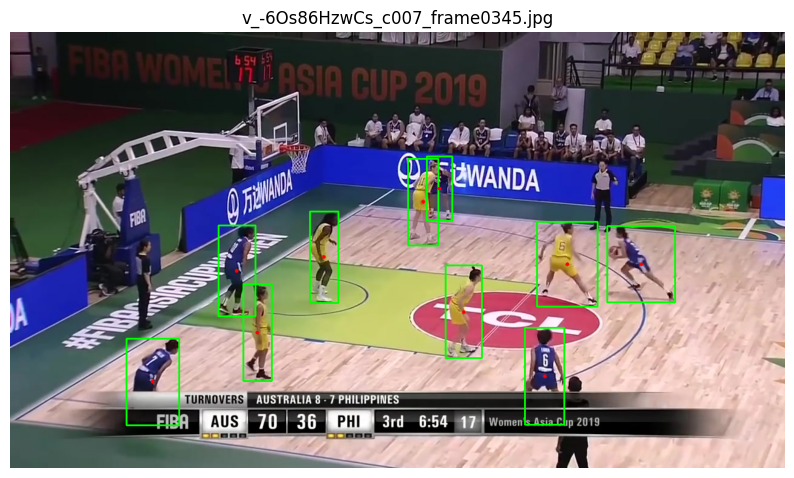

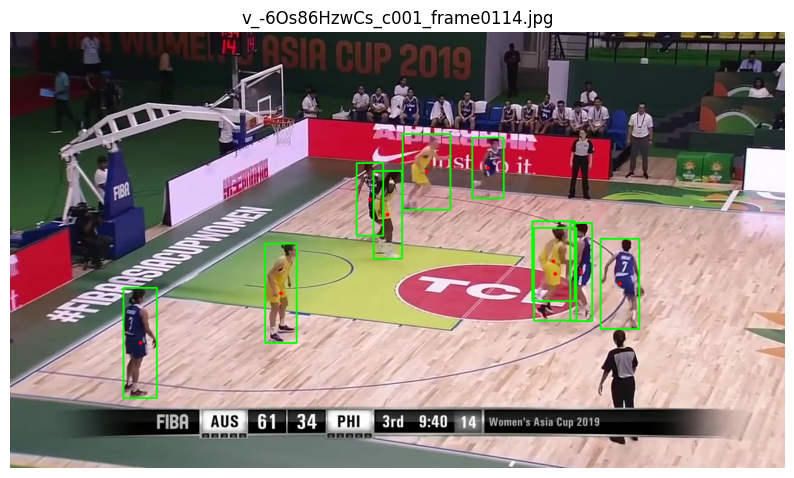

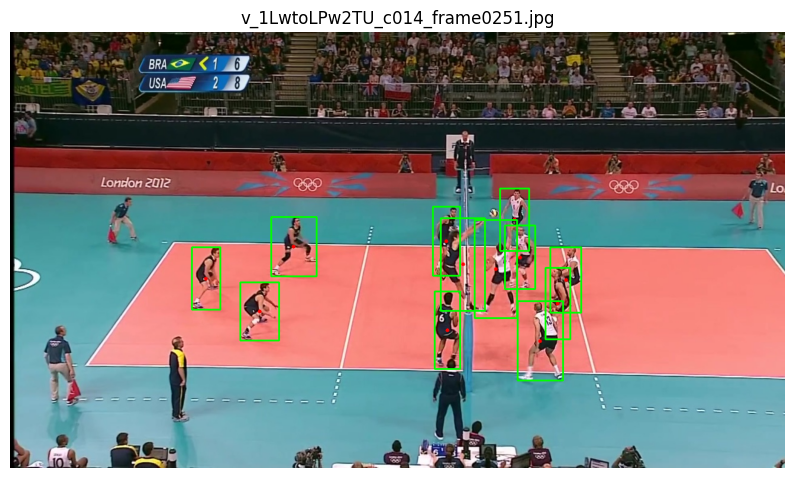

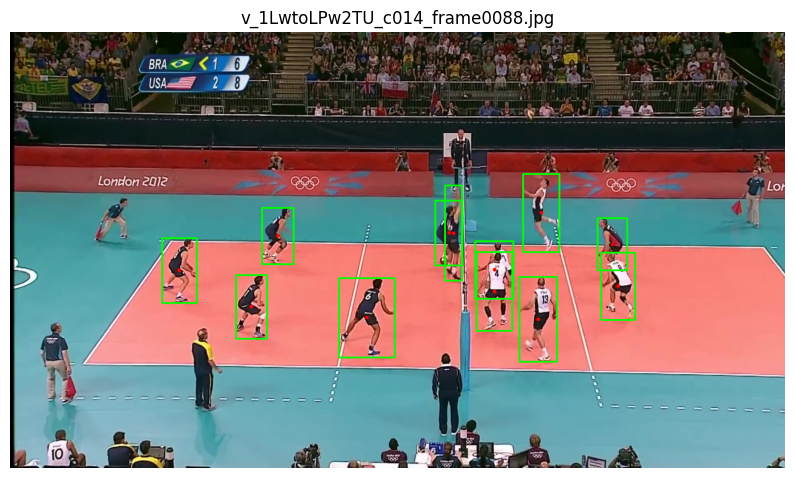

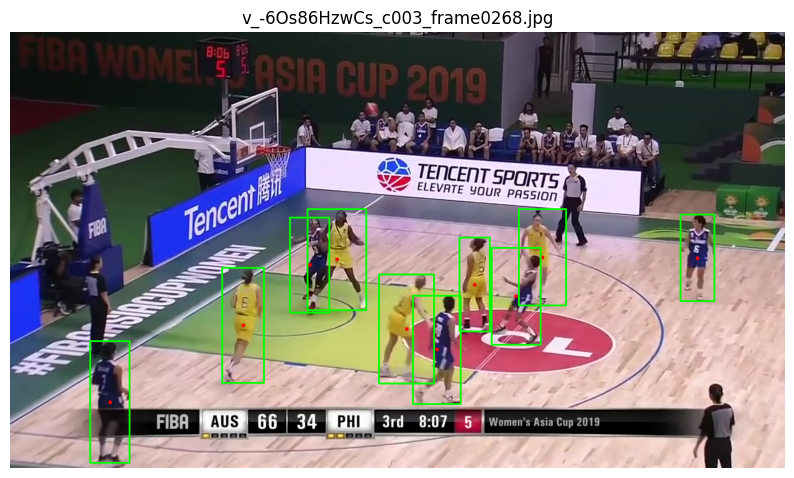

In [20]:
import os
import cv2
import matplotlib.pyplot as plt

images_dir = "/kaggle/working/train/images"
labels_dir = "/kaggle/working/train/labels"

# List all image files in the images directory
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# For visualization, display a few images
num_images_to_display = 5
selected_images = image_files[:num_images_to_display]

def draw_annotations(image, annotation_path):

    img_height, img_width = image.shape[:2]
    
    if os.path.exists(annotation_path):
        with open(annotation_path, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            parts = line.strip().split()
            if len(parts) != 5:
                continue  # skip invalid lines
            
            # Parse the YOLO annotation values
            cls, x_center_rel, y_center_rel, width_rel, height_rel = parts
            x_center_rel = float(x_center_rel)
            y_center_rel = float(y_center_rel)
            width_rel = float(width_rel)
            height_rel = float(height_rel)
            
            # Convert relative coordinates to absolute pixel values
            x_center = x_center_rel * img_width
            y_center = y_center_rel * img_height
            width_box = width_rel * img_width
            height_box = height_rel * img_height
            
            # Calculate top-left and bottom-right coordinates
            x_min = int(x_center - width_box / 2)
            y_min = int(y_center - height_box / 2)
            x_max = int(x_center + width_box / 2)
            y_max = int(y_center + height_box / 2)
            
            # Draw the rectangle on the image
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            # draw the centre point for my visualization
            cv2.circle(image, (int(x_center), int(y_center)), 3, (0, 0, 255), -1)
    
    return image


# Plot each image in a separate figure
for img_file in selected_images:
    image_path = os.path.join(images_dir, img_file)
    base_name = os.path.splitext(img_file)[0] + ".txt"
    annotation_path = os.path.join(labels_dir, base_name)
    
    image = cv2.imread(image_path)
    if image is None:
        continue
    
    image_with_boxes = draw_annotations(image.copy(), annotation_path)
    image_rgb = cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(img_file)
    plt.axis('off')
    plt.show()

## tracking single player in any video using CSRT

In [99]:
import cv2
import numpy as np
from ultralytics import YOLO
import time
import os
print("Commencing CSRT single object tracking with periodic YOLO re-detection and heat map generation.")

os.remove('/kaggle/working/csrt_tracked_output.mp4')
print("Previous output deleted")
VIDEO_PATH = "/kaggle/input/videoforsot2/video_2025-02-04_06-03-15.mp4"
cap = cv2.VideoCapture(VIDEO_PATH)

# Verify that the video was opened successfully
if not cap.isOpened():
    print("Error: Unable to open the video.")
    cap.release()
    exit()

# Read the first frame to perform detection and initialise the tracker
ret, frame = cap.read()
if not ret:
    print("Error: Unable to read the video.")
    cap.release()
    exit()

# Downscale the frame for faster processing during detection/tracking
frame_resized = cv2.resize(frame, (640, 480))

# Load your fine-tuned YOLO model (adjust the path if necessary)
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Perform detection on the first frame
results = model(frame_resized, verbose=False)
detections = results[0].boxes

if len(detections) == 0:
    print("No detections found in the first frame. Exiting.")
    cap.release()
    exit()

# Choose the first detection (highest-confidence one)
detection = detections[0]
x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
# Convert to CSRT format: (x, y, width, height)
bbox = (x1, y1, x2 - x1, y2 - y1)
print(f"Initial bounding box from YOLO: {bbox}")

# Initialise the CSRT tracker with the first frame and detection
tracker = cv2.TrackerCSRT_create()
tracker.init(frame_resized, bbox)

# Set up the video writer for the output video
frame_width = 1280
frame_height = 720 
fps = cap.get(cv2.CAP_PROP_FPS)
if fps == 0:
    print("Warning: FPS value is invalid. Using default FPS = 30.")
    fps = 30

OUTPUT_VIDEO_PATH = "/kaggle/working/csrt_tracked_output.mp4"
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (frame_width, frame_height))

heat_map = np.zeros((480, 640), dtype=np.float32)

# Define re-detection interval (every 0.5 sec)
redetect_interval = int(fps * 0.5)
frame_count = 0

# Define a maximum distance threshold (in pixels) for updating the box during periodic updates
distance_threshold = 50  # changable but this threshold is good

total_frames = 0
successful_frames = 0
reinit_count = 0

# Function to compute bottom centre of a bounding box (x, y, w, h)
def get_box_bottom_centre(box):
    x, y, w, h = box
    # Bottom centre: x-coordinate is x + w/2, y-coordinate is at the bottom (y + h)
    return (int(x + w / 2), int(y + h))

# Main loop: Process each frame of the video and update tracker
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    total_frames += 1
    frame_count += 1
    # Downscale the frame for tracking/detection
    frame_resized = cv2.resize(frame, (640, 480))

    # Update the tracker
    success, curr_box = tracker.update(frame_resized)
    if success:
        curr_box = tuple(map(int, curr_box))
        successful_frames += 1
        # Accumulate heat map: draw a small circle at the bottom centre of the tracked bounding box
        bottom_centre = get_box_bottom_centre(curr_box)
        cv2.circle(heat_map, bottom_centre, 5, 5, thickness=-1)  # Increase intensity at this point
    else:
        # If tracking fails, attempt to re-detect using YOLO immediately
        print(f"Tracking lost at frame {frame_count}. Running YOLO for new candidate.")
        results = model(frame_resized, verbose=False)
        detections = results[0].boxes
        if len(detections) > 0:
            # Choose the first detection (or select by confidence if desired)
            detection = detections[0]
            x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
            new_box = (x1, y1, x2 - x1, y2 - y1)
            bbox = new_box
            tracker = cv2.TrackerCSRT_create()
            tracker.init(frame_resized, bbox)
            reinit_count += 1
            print(f"Re-initialised tracker with new bounding box: {bbox}")
            success = True  # Now consider tracking as successful
            curr_box = bbox
            bottom_centre = get_box_bottom_centre(curr_box)
            cv2.circle(heat_map, bottom_centre, 5, 5, thickness=-1)
        else:
            cv2.putText(frame_resized, "Tracking Lost", (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

    # Every redetect_interval frames, run YOLO to re-adjust the bounding box if tracking is successful
    if frame_count % redetect_interval == 0 and success:
        results = model(frame_resized, verbose=False)
        detections = results[0].boxes
        if len(detections) > 0:
            # Compute current tracker bottom centre for comparison
            tracker_bottom = get_box_bottom_centre(curr_box)
            best_box = None
            min_distance = float('inf')
            # Iterate over detections and choose the one whose bottom centre is closest to our current bottom centre
            for det in detections:
                x1, y1, x2, y2 = det.xyxy[0].cpu().numpy()
                x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
                candidate_box = (x1, y1, x2 - x1, y2 - y1)
                candidate_bottom = get_box_bottom_centre(candidate_box)
                distance = np.sqrt((candidate_bottom[0] - tracker_bottom[0])**2 +
                                   (candidate_bottom[1] - tracker_bottom[1])**2)
                if distance < min_distance:
                    min_distance = distance
                    best_box = candidate_box

            # If the best candidate is close enough, update the bounding box
            if best_box is not None and min_distance < distance_threshold:
                bbox = best_box
                tracker = cv2.TrackerCSRT_create()
                tracker.init(frame_resized, bbox)
                reinit_count += 1
                

    # Draw the current bounding box if tracking is successful
    if success:
        x, y, w, h = curr_box
        cv2.rectangle(frame_resized, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame_resized, "Tracking", (x, y - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # heat map
    #smooth the heat map using a Gaussian filter
    heat_map_smoothed = cv2.GaussianBlur(heat_map, (21, 21), 0)
    #normalize heat map to 0-255 and convert to uint8
    heat_map_norm = cv2.normalize(heat_map_smoothed, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    # Apply a colour map to the heat map
    heat_map_coloured = cv2.applyColorMap(heat_map_norm, cv2.COLORMAP_JET)
    # Blend the coloured heat map with the current tracking frame
    overlay = cv2.addWeighted(frame_resized, 0.7, heat_map_coloured, 0.3, 0)

    # Resize the overlay frame to the desired output resolution before writing
    frame_output = cv2.resize(overlay, (frame_width, frame_height))
    out.write(frame_output)

cap.release()
out.release()
cv2.destroyAllWindows()

# performance statistics:
tracking_success_rate = (successful_frames / total_frames) * 100 if total_frames > 0 else 0
print(f"Tracked video has been saved as: {OUTPUT_VIDEO_PATH}")
print(f"Total frames processed: {total_frames}")
print(f"Successful tracking frames: {successful_frames} ({tracking_success_rate:.2f}%)")
print(f"Number of tracker re-initialisations: {reinit_count}")


Commencing CSRT single object tracking with periodic YOLO re-detection and heat map generation.
Previous output deleted
Initial bounding box from YOLO: (604, 277, 19, 58)
Tracking lost at frame 49. Running YOLO for new candidate.
Re-initialised tracker with new bounding box: (437, 300, 22, 51)
Tracked video has been saved as: /kaggle/working/csrt_tracked_output.mp4
Total frames processed: 643
Successful tracking frames: 642 (99.84%)
Number of tracker re-initialisations: 22


## creating video of train/val images

### for evaluating model we should make video of the val frames

In [100]:
import os
import cv2
import re

images_dir = "/kaggle/working/val/images"
video_id_to_use = "v_0kUtTtmLaJA_c007"

# List all image files for the selected video
all_files = os.listdir(images_dir)
video_files = [f for f in all_files if f.lower().endswith('.jpg') and f.startswith(video_id_to_use + "_")]

def extract_frame_number(filename):
    match = re.search(r'_frame(\d+)', filename)
    if match:
        return int(match.group(1))
    return -1

# Sort the video files by frame number
video_files.sort(key=extract_frame_number)

# Check that we have some frames
if not video_files:
    print(f"No images found for video ID: {video_id_to_use}")
    exit()

# Determining the frame size using the first image
first_image_path = os.path.join(images_dir, video_files[0])
first_frame = cv2.imread(first_image_path)
if first_frame is None:
    print("Error reading the first image.")
    exit()

resize_dim = (640, 480)
first_frame = cv2.resize(first_frame, resize_dim)

# Use the resized dimensions
height, width, _ = first_frame.shape


output_video_path = "/kaggle/working/video_from_val.mp4"
fps = 30
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out_video = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Loop through each sorted image and write to the video file
for i, img_file in enumerate(video_files):
    img_path = os.path.join(images_dir, img_file)
    frame = cv2.imread(img_path)
    if frame is None:
        print(f"Warning: Could not read {img_path}. Skipping.")
        continue
    # Resize each frame to the desired output resolution
    frame_resized = cv2.resize(frame, resize_dim)
    out_video.write(frame_resized)
    

out_video.release()
print(f"Video created from val images: {output_video_path}")


Video created from val images: /kaggle/working/video_from_val.mp4


In [ ]:
import os
os.remove('/kaggle/working/csrt_tracked_output.mp4')
os.remove('/kaggle/working/video_from_val.mp4')

In [102]:
import os
import cv2
import numpy as np
from ultralytics import YOLO 
import time

print("Commencing CSRT single object tracking with periodic YOLO re-detection, heat map generation and evaluation.")


VIDEO_PATH = "/kaggle/working/video_from_val.mp4"
OUTPUT_VIDEO_PATH = "/kaggle/working/csrt_tracked_output.mp4"
LABELS_DIR = "/kaggle/working/val/labels"  # Ground truth annotations in YOLO format
VIDEO_ID = "v_0kUtTtmLaJA_c007"


TRACKING_RES = (640, 480)
OUTPUT_RES = (1280, 720)

def yolo_to_bbox(yolo_line, img_width, img_height):
    """Convert YOLO annotation (class, x_center, y_center, width, height normalized)
       to bounding box in (x, y, w, h) with absolute pixel coordinates.
    """
    parts = yolo_line.strip().split()
    if len(parts) != 5:
        return None
    # We ignore class here (assume a single class players)
    _, x_c, y_c, w, h = map(float, parts)
    x_c *= img_width
    y_c *= img_height
    w *= img_width
    h *= img_height
    # Convert to top-left x,y
    x = int(x_c - w/2)
    y = int(y_c - h/2)
    return (x, y, int(w), int(h))

def compute_iou(boxA, boxB):
    """Compute Intersection over Union (IoU) between two bounding boxes.
       Boxes are in (x, y, w, h) format.
    """
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[0] + boxA[2], boxB[0] + boxB[2])
    yB = min(boxA[1] + boxA[3], boxB[1] + boxB[3])
    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    interArea = interW * interH
    boxAArea = boxA[2] * boxA[3]
    boxBArea = boxB[2] * boxB[3]
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-5)
    return iou

def get_box_bottom_centre(box):
    x, y, w, h = box
    return (int(x + w/2), int(y + h))

def load_ground_truth(frame_idx, labels_dir, video_id, img_size):
    filename = f"{video_id}_frame{frame_idx:04d}.txt"
    file_path = os.path.join(labels_dir, filename)
    if not os.path.exists(file_path):
        return None
    with open(file_path, "r") as f:
        lines = f.readlines()
    if not lines:
        return None
    # assume one object per frame (or take the first one with the most confident I assume)
    return yolo_to_bbox(lines[0], img_size[0], img_size[1])

#Initialize Video Capture & Writer 
cap = cv2.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    print("Error: Unable to open the video.")
    cap.release()
    exit()

ret, frame = cap.read()
if not ret:
    print("Error: Unable to read the video.")
    cap.release()
    exit()

# Resize first frame for processing
frame_resized = cv2.resize(frame, TRACKING_RES)

model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Run detection on the first frame to initialize the tracker
results = model(frame_resized, verbose=False)
detections = results[0].boxes
if len(detections) == 0:
    print("No detections found in the first frame. Exiting.")
    cap.release()
    exit()
detection = detections[0]
x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
bbox = (x1, y1, x2 - x1, y2 - y1)
print(f"Initial bounding box from YOLO: {bbox}")

tracker = cv2.TrackerCSRT_create()
tracker.init(frame_resized, bbox)

fps = cap.get(cv2.CAP_PROP_FPS) #if only one image 
if fps == 0:
    fps = 30
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, OUTPUT_RES)

# Heat Map & Evaluation Metrics Initialization 
heat_map = np.zeros((TRACKING_RES[1], TRACKING_RES[0]), dtype=np.float32)
redetect_interval = int(fps * 0.5)
frame_count = 0
distance_threshold = 50

total_frames = 0
successful_frames = 0
reinit_count = 0
iou_list = []
center_errors = []

#Main Loop
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    total_frames += 1
    frame_count += 1

    frame_resized = cv2.resize(frame, TRACKING_RES)
    success, curr_box = tracker.update(frame_resized)
    if success:
        curr_box = tuple(map(int, curr_box))
        successful_frames += 1
        bottom_centre = get_box_bottom_centre(curr_box)
        cv2.circle(heat_map, bottom_centre, 5, 5, thickness=-1)
    else:
        print(f"Tracking lost at frame {frame_count}. Running YOLO for new candidate.")
        results = model(frame_resized, verbose=False)
        detections = results[0].boxes
        if len(detections) > 0:
            detection = detections[0]
            x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
            new_box = (x1, y1, x2 - x1, y2 - y1)
            bbox = new_box
            tracker = cv2.TrackerCSRT_create()
            tracker.init(frame_resized, bbox)
            reinit_count += 1
            print(f"Re-initialised tracker with new bounding box: {bbox}")
            success = True
            curr_box = bbox
            bottom_centre = get_box_bottom_centre(curr_box)
            cv2.circle(heat_map, bottom_centre, 5, 5, thickness=-1)
        else:
            cv2.putText(frame_resized, "Tracking Lost", (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

    # periodic update via YOLO
    if frame_count % redetect_interval == 0 and success:
        results = model(frame_resized, verbose=False)
        detections = results[0].boxes
        if len(detections) > 0:
            tracker_bottom = get_box_bottom_centre(curr_box)
            best_box = None
            min_distance = float('inf')
            for det in detections:
                x1, y1, x2, y2 = det.xyxy[0].cpu().numpy()
                x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
                candidate_box = (x1, y1, x2 - x1, y2 - y1)
                candidate_bottom = get_box_bottom_centre(candidate_box)
                distance = np.sqrt((candidate_bottom[0] - tracker_bottom[0])**2 +
                                   (candidate_bottom[1] - tracker_bottom[1])**2)
                if distance < min_distance:
                    min_distance = distance
                    best_box = candidate_box
            if best_box is not None and min_distance < distance_threshold:
                bbox = best_box
                tracker = cv2.TrackerCSRT_create()
                tracker.init(frame_resized, bbox)
                reinit_count += 1

    # Draw tracked bounding box
    if success:
        x, y, w, h = curr_box
        cv2.rectangle(frame_resized, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame_resized, "Tracking", (x, y - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    #Evaluation: Compare with Ground Truth 
    gt_box = load_ground_truth(frame_count, LABELS_DIR, VIDEO_ID, TRACKING_RES)
    if gt_box is not None:
        # Draw ground truth in red for visualisation
        cv2.rectangle(frame_resized, (gt_box[0], gt_box[1]), (gt_box[0]+gt_box[2], gt_box[1]+gt_box[3]),
                      (0, 0, 255), 2)
        # Compute IoU and centre error
        iou = compute_iou(curr_box, gt_box) if success else 0
        iou_list.append(iou)
        # Centre error (Euclidean distance)
        tracked_center = (curr_box[0] + curr_box[2]/2, curr_box[1] + curr_box[3]/2) if success else (0,0)
        gt_center = (gt_box[0] + gt_box[2]/2, gt_box[1] + gt_box[3]/2)
        center_error = np.sqrt((tracked_center[0] - gt_center[0])**2 +
                               (tracked_center[1] - gt_center[1])**2)
        center_errors.append(center_error)
        cv2.putText(frame_resized, f"IoU: {iou:.2f}", (50, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
        cv2.putText(frame_resized, f"Err: {center_error:.1f}", (50, 60),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

    # Overlay heat map
    heat_map_smoothed = cv2.GaussianBlur(heat_map, (21, 21), 0)
    heat_map_norm = cv2.normalize(heat_map_smoothed, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    heat_map_coloured = cv2.applyColorMap(heat_map_norm, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(frame_resized, 0.7, heat_map_coloured, 0.3, 0)

    frame_output = cv2.resize(overlay, OUTPUT_RES)
    out.write(frame_output)

cap.release()
out.release()
cv2.destroyAllWindows()

# Performance Statistics
tracking_success_rate = (successful_frames / total_frames) * 100 if total_frames > 0 else 0
avg_iou = np.mean(iou_list) if iou_list else 0
avg_center_error = np.mean(center_errors) if center_errors else 0

print(f"Tracked video has been saved as: {OUTPUT_VIDEO_PATH}")
print(f"Total frames processed: {total_frames}")
print(f"Successful tracking frames: {successful_frames} ({tracking_success_rate:.2f}%)")
print(f"Number of tracker re-initialisations: {reinit_count}")
print(f"Average IoU: {avg_iou:.3f}")
print(f"Average centre error: {avg_center_error:.2f} pixels")


Commencing CSRT single object tracking with periodic YOLO re-detection, heat map generation and evaluation.
Initial bounding box from YOLO: (133, 245, 26, 96)
Tracked video has been saved as: /kaggle/working/csrt_tracked_output.mp4
Total frames processed: 270
Successful tracking frames: 270 (100.00%)
Number of tracker re-initialisations: 18
Average IoU: 0.376
Average centre error: 20.87 pixels


<font color="green">**3. Challenges**  
Occlusion was a bit tricky to deal with, but the algorithm handled scale variation and illumination changes effectively by leveraging YOLO's robust detection capabilities alongside its own tracking logic. However, when implementing the raw CSRT algorithm, tracking players reliably became challenging in scenarios involving rapid motion or partial occlusion. Unlike YOLO, which provides periodic object detection to reset the tracker's reference, the standalone CSRT relies heavily on spatial and texture consistency. This makes it prone to drift when players are temporarily obscured (e.g., by other players or objects) or when sudden scale changes occur due to fast camera pans or zooming. For instance, during close-up shots where a player’s size in the frame fluctuates dynamically, CSRT’s fixed bounding box adaptation struggled to maintain accurate localization without YOLO’s intermittent corrections. Additionally, in low-light conditions or under uneven illumination, CSRT’s reliance on gradient-based features further degraded performance, highlighting the importance of integrating detection-driven frameworks like YOLO for robustness in complex environments.  

<font color="green">**5. where the algorithm has good perfromance and where errors occur**<br>
**Good Performance**:  
The algorithm excels in handling **scale variation** (like players moving closer/farther from the camera) and **illumination changes** (shadows or varying lighting) due to YOLO’s detection robustness and adaptive tracking. It also maintains accuracy during gradual motion and dynamic scaling when YOLO periodically resets the tracker.  
**Errors Occur**:  
Challenges arise during **occlusion** (players obscured by others/objects), **rapid motion** (sudden camera pans or fast player movements), and **low-light conditions**, where texture/gradient-based tracking (CSRT) struggles without YOLO’s corrections. Errors also spike during partial/full occlusions, causing tracker drift or lost targets.

# 2.3 Multiple Object Tracking

 
### 1. Selecting the Algorithm and Explaining Its Suitability  
Algorithm:  
I have chosen ByteTrack, which is one of the most advanced algorithms for multi-object tracking (MOT).  

Why ByteTrack is Suitable for This Scenario:  
- ByteTrack leverages low-score detections, which improves tracking accuracy compared to traditional methods like SORT and DeepSORT.  
- It integrates deep learning-based object detection models, making it robust in challenging scenarios such as occlusions and lighting changes.  
- Unlike many other methods that rely only on high-confidence detections, ByteTrack processes all detected objects, including those with lower confidence scores, ensuring better stability and reduced object loss.  

### 2. Relationship Between Object Detection and Tracking  
Detection and tracking are closely linked in ByteTrack. Initially, an object detection network (such as YOLO, Faster R-CNN, or CenterNet) is used to identify object locations and classes in each video frame. The detection network outputs a list of bounding boxes along with their confidence scores.  

In ByteTrack, detections are categorized into two groups:  
- High-confidence detections → These are immediately used for tracking.  
- Low-confidence detections → These are still considered in later steps to prevent premature object disappearance.  

Finally, the output of the detection model (bounding boxes) is combined with temporal information from previous frames in ByteTrack to ensure continuous and stable object tracking.  

### 3. Assignment Process in ByteTrack  
In ByteTrack, object assignment across consecutive frames is handled using assignment algorithms like the Hungarian Algorithm.  

The assignment process works as follows:  
1. Compute the distance (cost) between detected bounding boxes in the current frame and existing tracked objects from the previous frame, using metrics such as Intersection over Union (IoU) or center distance.  
2. Construct a cost matrix, representing the similarity between new detections and existing tracked objects.  
3. Apply the Hungarian Algorithm to find the optimal matching between new detections and existing tracked objects.  
4. If an object in the new frame does not match any existing track, a new ID is assigned to it.  
5. Tracks that fail to match any detections for multiple frames are removed from the tracker.  

This method ensures stable and accurate tracking even in complex scenarios with occlusions, fast object movements, or varying scales.
The Hungarian Algorithm is an optimization method used to solve assignment problems efficiently. It finds the optimal way to assign n tasks to n workers while minimizing the total cost.  

###  Steps  
1. Create a cost matrix, where each element represents the cost of assigning a task to a worker.  
2. Row and column reduction:  
   - Subtract the minimum value in each row from all elements in that row.  
   - Subtract the minimum value in each column from all elements in that column.  
3. Cover all zeros with the minimum number of lines (rows/columns).  
4. Check for optimality:  
   - If the number of lines equals the number of rows/columns, the optimal assignment is found.  
   - Otherwise, adjust the matrix and repeat until the solution is reached.  
5. Assign tasks optimally based on the final matrix.  
  

### Complexity  
- O(n³), making it efficient for many real-world applications.  

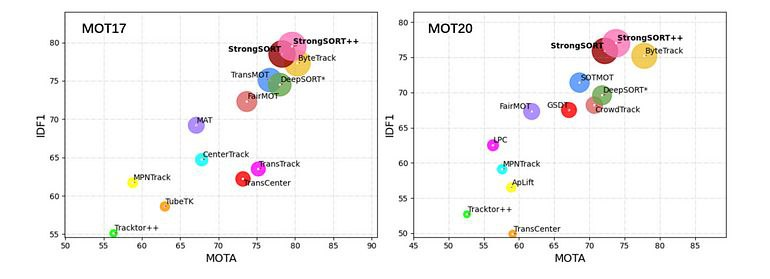

## Byte Track implementation

In [38]:
!pip install lap
!pip install ultralytics --quiet
!pip install utils --quiet
!pip install nets 

In [44]:
!rm -rf /kaggle/working/ByteTrack

In [45]:
!git clone https://github.com/jahongir7174/ByteTrack /kaggle/working/ByteTrack

Cloning into '/kaggle/working/ByteTrack'...
remote: Enumerating objects: 19, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 19 (delta 1), reused 4 (delta 1), pack-reused 13 (from 1)
Receiving objects: 100% (19/19), 47.85 MiB | 46.01 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [54]:
import importlib.util

# Load the util.py module explicitly
util_path = "/kaggle/working/ByteTrack/utils/util.py"
spec_util = importlib.util.spec_from_file_location("bytetrack_util", util_path)
bytetrack_util = importlib.util.module_from_spec(spec_util)
spec_util.loader.exec_module(bytetrack_util)

# Now use bytetrack_util instead of util
print("Module loaded successfully!")



Module loaded successfully!


In [103]:
import os
import sys
import cv2
import torch
import numpy as np
import warnings
import base64
from IPython.display import display, HTML
from PIL import Image
torch.cuda.empty_cache()
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False

byte_track_dir = "/kaggle/working/ByteTrack/"
if byte_track_dir not in sys.path:
    sys.path.insert(0, byte_track_dir)
    sys.path.append(byte_track_dir)

# Import ByteTrack modules
from ByteTrack.utils import util
from ByteTrack.nets import nn

warnings.filterwarnings("ignore")


def draw_bounding_box(img, x1, y1, x2, y2, obj_id):
    box_color = (255, 255, 255)
    thickness = 2
    cv2.rectangle(img, (x1, y1), (x2, y2), box_color, thickness)
    # Add ID text
    cv2.putText(img, f'ID:{obj_id}', (x1, y1 - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, box_color,
                thickness=1, lineType=cv2.LINE_AA)


def process_video():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    target_size = 640  # Model input size

    model_file = '/kaggle/working/runs/detect/train/weights/best.pt'
    if not os.path.exists(model_file):
        print(f"Error: Model file not found at {model_file}")
        return

    checkpoint = torch.load(model_file, map_location=device)
    model = checkpoint['model'].float().to(device)
    model.eval()
    model.half()

    # Open the video file
    video_path = '/kaggle/working/val_video.mp4'
    if not os.path.exists(video_path):
        print(f"Error: Video file not found at {video_path}")
        return

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Cannot open video stream or file")
        return

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    tracker = nn.BYTETracker(fps)

    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the video writer
    output_path = '/kaggle/working/ByteTrack_output_video.mp4'
    codec = cv2.VideoWriter_fourcc(*'mp4v')
    out_writer = cv2.VideoWriter(output_path, codec, fps, (frame_width, frame_height))

    # Prepare a list to hold predictions for each frame.[Frame, ID, X, Y, Width, Height, Score]
    predictions_list = []

    sample_frame = None  #for capturing the first processed frame
    frame_idx = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        bboxes, scores, classes = [], [], []

        # Work on a resized copy of the frame
        proc_img = frame.copy()
        orig_shape = proc_img.shape[:2]
        scaling_ratio = target_size / max(orig_shape)
        if scaling_ratio != 1:
            proc_img = cv2.resize(proc_img, (int(orig_shape[1] * scaling_ratio),
                                              int(orig_shape[0] * scaling_ratio)),
                                  interpolation=cv2.INTER_LINEAR)

        new_h, new_w = proc_img.shape[:2]
        proc_img, ratio, padding = util.resize(proc_img, target_size)
        shapes = orig_shape, ((new_h / orig_shape[0], new_w / orig_shape[1]), padding)

        # Convert image from HWC (BGR) to CHW (RGB) format and normalize
        tensor_img = proc_img.transpose(2, 0, 1)[::-1]
        tensor_img = np.ascontiguousarray(tensor_img)
        tensor_img = torch.from_numpy(tensor_img).unsqueeze(0).to(device)
        tensor_img = tensor_img.half() / 255.0

        # Perform inference without computing gradients
        with torch.no_grad():
            preds = model(tensor_img)
            # If the output is a tuple, assume the first element contains predictions
            if isinstance(preds, tuple):
                preds = preds[0]

        if not isinstance(preds, torch.Tensor):
            raise TypeError(f"Expected model output as torch.Tensor but got {type(preds)}.")

        # Apply non-maximum suppression
        nms_out = util.non_max_suppression(preds, 0.001, 0.7)

        # Process each detection
        for batch_idx, detections in enumerate(nms_out):
            if detections is None or detections.numel() == 0:
                continue
            detections = detections.clone()
            util.scale(detections[:, :4], tensor_img.shape[2:], shapes[0], shapes[1])
            detections = detections.cpu().numpy()
            for det in detections:
                x1, y1, x2, y2 = map(int, det[:4])
                bboxes.append([x1, y1, x2, y2])
                scores.append(det[4])
                classes.append(det[5])

        # Update the ByteTrack tracker
        if bboxes:
            tracked_objects = tracker.update(np.array(bboxes),
                                               np.array(scores),
                                               np.array(classes))
            if tracked_objects is not None and len(tracked_objects) > 0:
                # output format: [x1, y1, x2, y2, track_id, score, class_id]
                for obj in tracked_objects:
                    x1, y1, x2, y2 = map(int, obj[:4])
                    # Only save detections for class "person"
                    if int(obj[6]) != 0:
                        continue
                    track_id = int(obj[4]) if obj[4] is not None else 0
                    score = obj[5]
                    
                    # Draw the bounding box on the frame
                    draw_bounding_box(frame, x1, y1, x2, y2, track_id)
                    
                    width = x2 - x1
                    height = y2 - y1
                    # Append prediction information: Frame, ID, X, Y, Width, Height, Score
                    predictions_list.append([frame_idx, track_id, x1, y1, width, height, score])

        # Write the processed frame
        out_writer.write(frame)

        # Save the first frame as a sample
        if frame_idx == 0:
            sample_frame = frame.copy()
        frame_idx += 1

    cap.release()
    out_writer.release()
    cv2.destroyAllWindows()

    pred_file_path = '/kaggle/working/ByteTrack_predictions.txt'
    with open(pred_file_path, 'w') as f:
        # Write one prediction per line, comma-separated
        # Format: Frame,ID,X,Y,Width,Height,Score to match the ground truth
        for pred in predictions_list:
            line = ','.join([str(val) for val in pred])
            f.write(line + '\n')

    if os.path.exists(output_path):
        print("The ByteTrack output video has been made.")
    else:
        print("Video processing failed.")
        
    print(f"Predictions saved to: {pred_file_path}")

if __name__ == '__main__':
    process_video()


The ByteTrack output video has been made.
Predictions saved to: /kaggle/working/ByteTrack_predictions.txt


## Evaluating ByteTrack

In [96]:
import motmetrics as mm
import pandas as pd
import numpy as np

def load_and_fix_dataframe(file_path, expected_cols):
    df = pd.read_csv(file_path, header=None)
    num_expected = len(expected_cols)
    
    if df.shape[1] > num_expected:
        df = df.iloc[:, :num_expected]
    elif df.shape[1] < num_expected:
        # For missing columns, add new ones filled with -1
        for i in range(num_expected - df.shape[1]):
            df[df.shape[1]] = -1
    
    df.columns = expected_cols
    return df

# Define the expected columns for both ground truth and prediction files
cols = ['Frame', 'ID', 'X', 'Y', 'Width', 'Height', 'Score']


# Load Ground-Truth Data
gt_file = '/kaggle/working/val_annotations_mot.txt'
gt = load_and_fix_dataframe(gt_file, cols)

# Convert (X, Y, Width, Height) to (x1, y1, x2, y2)
gt['x1'] = gt['X']
gt['y1'] = gt['Y']
gt['x2'] = gt['X'] + gt['Width']
gt['y2'] = gt['Y'] + gt['Height']


#  Load Tracker Predictions
pred_file = '/kaggle/working/ByteTrack_predictions.txt'
pred = load_and_fix_dataframe(pred_file, cols)

pred['x1'] = pred['X']
pred['y1'] = pred['Y']
pred['x2'] = pred['X'] + pred['Width']
pred['y2'] = pred['Y'] + pred['Height']


# Set Up the MOTAccumulator
# Disable auto_id because we are providing frame ids.
acc = mm.MOTAccumulator(auto_id=False)

# Use the union of frames from both ground truth and predictions
all_frames = sorted(set(gt['Frame'].unique()) | set(pred['Frame'].unique()))

# Process each frame: extract GT and predictions and compute the distance matrix.
for frame in all_frames:
    # Ground truth for this frame
    gt_frame = gt[gt['Frame'] == frame]
    gt_ids = list(gt_frame['ID'])
    gt_boxes = list(zip(gt_frame['x1'], gt_frame['y1'], gt_frame['x2'], gt_frame['y2']))
    
    # Predictions for this frame
    pred_frame = pred[pred['Frame'] == frame]
    pred_ids = list(pred_frame['ID'])
    pred_boxes = list(zip(pred_frame['x1'], pred_frame['y1'], pred_frame['x2'], pred_frame['y2']))
    
    # Compute the IoU distance matrix.
    distance_matrix = mm.distances.iou_matrix(gt_boxes, pred_boxes, max_iou=0.5)
    
    # Update the accumulator for the current frame.
    acc.update(gt_ids, pred_ids, distance_matrix, frame)

# Compute Evaluation Metrics

metrics_to_compute = [
    'mota', 'precision', 'recall', 'idf1', 'motp' , 'idp', 'idr',
    'num_switches', 'mostly_tracked', 'partially_tracked', 'mostly_lost'
]

mh = mm.metrics.create()
summary = mh.compute(acc, metrics=metrics_to_compute, name='acc')

print(mm.io.render_summary(
    summary,
    formatters=mh.formatters,
    namemap=mm.io.motchallenge_metric_names
))


     MOTA  Prcn  Rcll  MOTP  IDF1   IDP   IDR IDs MT PT ML
acc 84.0% 89.0% 96.8% 0.042 81.0% 77.7% 84.6%  37 21  0  0


## 7.DeepSort implementation(bounos)

In [4]:
!pip install deep_sort_realtime
!pip install ultralytics
!pip install motmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 53.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 15.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 3.9 MB/s eta 0:00:00a 0:00:01


In [104]:
import os
import cv2
import numpy as np
import pandas as pd


# Generate Video from Images
def create_video_from_images(image_dir, output_video_path, fps=25, resolution=(1280, 720)):
    images = sorted([img for img in os.listdir(image_dir) if img.endswith(('.jpg', '.png'))])
    if not images:
        print(f"No images found in {image_dir}")
        return
    
    # Read first frame to get dimensions
    first_image = cv2.imread(os.path.join(image_dir, images[0]))
    height, width, _ = first_image.shape

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for img_name in images:
        frame = cv2.imread(os.path.join(image_dir, img_name))
        if frame is None:
            continue
        video_writer.write(frame)

    video_writer.release()
    print(f"Video saved: {output_video_path}")

IMAGE_DIR = "/kaggle/input/sportsmot/sportsmot_publish/dataset/val/v_i2_L4qquVg0_c007/img1"
OUTPUT_VIDEO_PATH = "/kaggle/working/val_video.mp4"

# Create video from images
create_video_from_images(IMAGE_DIR, OUTPUT_VIDEO_PATH)


# Convert Annotations to MOT Format
def convert_annotations_to_mot(gt_file_path, output_mot_path, delimiter=None):
    """
    Convert SportsMOT annotation file to MOTChallenge format.
    SportsMOT format: frame_id, object_id, x, y, width, height, class_id, visibility
    MOT format: frame, id, x, y, width, height, confidence, -1, -1, -1
    """
    # If the file is "comma-separated", we can leave delimiter=None.
    try:
        df = pd.read_csv(gt_file_path, header=None, delimiter=delimiter)
    except Exception as e:
        print(f"Error reading {gt_file_path}: {e}")
        return

    if df.empty:
        print(f"The file {gt_file_path} appears to be empty or could not be read correctly.")
        return

    # Ensure the file has at least 6 columns (SportsMOT annotation format)
    if df.shape[1] < 6:
        print(f"Expected at least 6 columns in the annotation file, but got {df.shape[1]}")
        return

    # Select first six columns
    df = df.iloc[:, :6]
    
    # Insert a column for confidence (assume 1.0) and fill the remaining columns with -1
    df.insert(6, "confidence", 1.0)
    
    # Add three columns with -1 (if not already present)
    for col in range(7, 10):
        df.insert(col, f"col{col}", -1)

    # Save the converted annotations in MOTChallenge format
    df.to_csv(output_mot_path, header=False, index=False)
    print(f"Converted annotations saved: {output_mot_path}")

GT_ANNOTATIONS_PATH = "/kaggle/input/sportsmot/sportsmot_publish/dataset/val/v_i2_L4qquVg0_c007/gt/gt.txt"
OUTPUT_GT_MOT_PATH = "/kaggle/working/val_annotations_mot.txt"

# Convert annotations (if the file is space-separated, try delimiter=' ')
convert_annotations_to_mot(GT_ANNOTATIONS_PATH, OUTPUT_GT_MOT_PATH, delimiter=None)


Video saved: /kaggle/working/val_video.mp4
Converted annotations saved: /kaggle/working/val_annotations_mot.txt


In [ ]:
import os
os.remove('/kaggle/working/val_annotations_mot.txt')

In [105]:
import os
import cv2
import torch
import numpy as np
import pandas as pd
from ultralytics import YOLO  
from deep_sort_realtime.deepsort_tracker import DeepSort  
import motmetrics as mm  
import time

def compute_mot_metrics(gt_file, ts_file):
    """
    Compute MOT metrics using ground truth and tracking results.
    Both files in MOTChallenge format:
      frame, id, x, y, width, height, confidence, -1, -1, -1
    """
    gt = mm.io.load_motchallenge(gt_file)
    ts = mm.io.load_motchallenge(ts_file)
    acc = mm.utils.compare_to_groundtruth(gt, ts, 'iou', distth=0.5)
    mh = mm.metrics.create()
    summary = mh.compute(acc, metrics=[
        'mota', 'precision', 'recall', 'idf1', 'motp', 'idp', 'idr',
        'num_switches', 'mostly_tracked', 'partially_tracked', 'mostly_lost'
    ], name='acc')
    mh = mm.metrics.create()
    summary = mh.compute(acc, metrics=metrics_to_compute, name='acc')

    summary_str = mm.io.render_summary(
        summary,
        formatters=mh.formatters,
        namemap=mm.io.motchallenge_metric_names
    )
    
    return summary_str

def main():
    print("Starting DeepSORT tracking with improved classification.")

    INPUT_VIDEO_PATH = "/kaggle/working/val_video.mp4"  
    OUTPUT_VIDEO_PATH = "/kaggle/working/output_video_Deepsort_fixed.mp4"
    MODEL_WEIGHTS_PATH = "/kaggle/working/runs/detect/train/weights/best.pt"
    GT_FILE_PATH = "/kaggle/working/val_annotations_mot.txt"  
    RESULTS_FILE_PATH = os.path.join("/kaggle/working/", "tracking_results_deepsort_fixed.txt")
    if os.path.exists(RESULTS_FILE_PATH):
        os.remove(RESULTS_FILE_PATH)

    FPS = 30

    CLASS_NAMES = ["player", "referee", "ball"] #soccernet format
    CLASS_COLORS = {
        "player": (255, 255, 0),
        "referee": (0, 0, 255),
        "ball": (0, 200, 200)
    }
    MIN_CONFIDENCE = 0.5

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    yolo_model = YOLO(MODEL_WEIGHTS_PATH).to(device)
    tracker = DeepSort(
        max_age=5,
        n_init=2,
        nms_max_overlap=0.3
    )

    # Initialise Video Capture & Writer
    cap = cv2.VideoCapture(INPUT_VIDEO_PATH)
    if not cap.isOpened():
        print("Error: Unable to open the video.")
        cap.release()
        return

    # Use the original video resolution (assumed to match ground truth)
    orig_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    orig_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    OUTPUT_RES = (orig_width, orig_height)
    print(f"Original resolution: {OUTPUT_RES}")

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, FPS, OUTPUT_RES)


    # Tracking Loop: (Using Original Resolution)
    frame_idx = 0
    start_time = time.time()

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_idx += 1
        
        results = yolo_model(frame, device=device, verbose=False)[0]

        processed_boxes = []
        if results.boxes is not None:
            boxes = results.boxes.xyxy.cpu().numpy()  
            confidences = results.boxes.conf.cpu().numpy()
            class_ids = results.boxes.cls.cpu().numpy()

            for i, box in enumerate(boxes):
                if confidences[i] < MIN_CONFIDENCE:
                    continue
                class_id = int(class_ids[i])
                class_name = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else "unknown"

                if class_name == "referee":
                    continue  

                xmin, ymin, xmax, ymax = map(int, box)
                width, height = xmax - xmin, ymax - ymin
                processed_boxes.append([[xmin, ymin, width, height], confidences[i], class_name])

        # Update the DeepSORT tracker with detections on the original frame
        tracks = tracker.update_tracks(processed_boxes, frame=frame)

        
        # frame, id, x, y, width, height, confidence, -1, -1, -1
        with open(RESULTS_FILE_PATH, "a") as f:
            for track in tracks:
                if not track.is_confirmed():
                    continue
                track_id = track.track_id
                x1, y1, x2, y2 = map(int, track.to_ltrb())
                conf = float(track.det_conf) if track.det_conf is not None else 0.0

                best_match_class = "player"  # default if the input is on sportsmot
                for box_data in processed_boxes:
                    bbox, conf_det, cls_name = box_data
                    if abs(bbox[0] - x1) < 10 and abs(bbox[1] - y1) < 10:
                        best_match_class = cls_name
                        break

                color = CLASS_COLORS.get(best_match_class, (255, 255, 255))
                width = x2 - x1
                height = y2 - y1

                line = f"{frame_idx},{track_id},{x1},{y1},{width},{height},{conf:.2f},-1,-1,-1\n"
                f.write(line)

                # Draw bounding box and label on the frame for visualisation
                label = f"{best_match_class} {track_id} ({conf:.2f})"
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, label, (x1, y1 - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        video_writer.write(frame)

    cap.release()
    video_writer.release()
    cv2.destroyAllWindows()

    elapsed = time.time() - start_time
    print(f"Processed {frame_idx} frames in {elapsed:.2f} seconds.")

    
    # Results and Compute MOT Metrics
    # Adjust frame numbers to start from 1 if needed (alignment with ground truth?)
    tracking_data = pd.read_csv(RESULTS_FILE_PATH, header=None)
    tracking_data[0] -= tracking_data[0].min() - 1
    tracking_data[[2, 3, 4, 5]] = tracking_data[[2, 3, 4, 5]].astype(int)
    tracking_data.to_csv(RESULTS_FILE_PATH, header=False, index=False)

    try:
        metrics_summary = compute_mot_metrics(GT_FILE_PATH, RESULTS_FILE_PATH)
        print(metrics_summary)
    except Exception as e:
        print("Error computing MOT metrics. Check ground truth format.", e)

if __name__ == '__main__':
    main()


Starting DeepSORT tracking with improved classification.
Original resolution: (1280, 720)
Processed 451 frames in 26.95 seconds.
     MOTA  Prcn  Rcll  MOTP  IDF1   IDP   IDR IDs MT PT ML
acc 65.1% 79.7% 88.5% 0.243 63.6% 60.5% 67.1%  39 18  3  0


In [98]:
import pandas as pd


GT_FILE_PATH = "/kaggle/working/val_annotations_mot.txt"
TRACK_FILE_PATH = "/kaggle/working/tracking_results_deepsort_fixed.txt"

gt_df = pd.read_csv(GT_FILE_PATH, header=None)
track_df = pd.read_csv(TRACK_FILE_PATH, header=None)

print(" Ground Truth (GT) Annotations:")
print(gt_df.head())

print("\n Tracking Results:")
print(track_df.head())


 Ground Truth (GT) Annotations:
   0  1    2    3   4   5    6  7  8  9
0  1  0  660  331  22  77  1.0 -1 -1 -1
1  1  1  747  279  30  71  1.0 -1 -1 -1
2  1  2  803  498  58  94  1.0 -1 -1 -1
3  1  3  359  372  27  82  1.0 -1 -1 -1
4  1  4  298  300  29  61  1.0 -1 -1 -1

 Tracking Results:
   0  1     2    3   4   5     6  7  8  9
0  1  1  1209  416  39  86  0.89 -1 -1 -1
1  1  2   936  263  28  58  0.88 -1 -1 -1
2  1  3  1247  297  28  65  0.84 -1 -1 -1
3  1  4   629  208  35  50  0.84 -1 -1 -1
4  1  5   801  455  30  82  0.86 -1 -1 -1



**Comparison of ByteTrack and DeepSort Tracking Metrics**

| Metric              | ByteTrack       | DeepSort       |
|---------------------|-----------------|----------------|
| **MOTA**            | 84.0%         | 65.1%         |
| **Precision**       | 89.0%         | 79.7%         |
| **Recall**          | 96.8%         | 88.5%         |
| **MOTP**            | 0.042         | 0.243         |
| **IDF1**            | 81.0%         | 63.6%         |
| **ID Precision**    | 77.7%         | 60.5%         |
| **ID Recall**       | 84.6%         | 67.1%         |
| **Num Switches**    | 37            | 39            |
| **Mostly Tracked**  | 21            | 18            |
| **Partially Tracked** | 0           | 3             |
| **Mostly Lost**     | 0             | 0             |

---

### Explanation of Metrics

1. **MOTA (Multiple Object Tracking Accuracy):**  
   - **ByteTrack:** 84.0%  
     **DeepSort:** 65.1%  
   **Explanation:** MOTA is an overall tracking accuracy measure that takes false positives, missed targets, and identity switches into account. ByteTrack achieves a higher MOTA, suggesting it has fewer missed detections and better overall tracking accuracy compared to DeepSort.

2. **Precision:**  
   - **ByteTrack:** 89.0%  
     **DeepSort:** 79.7%  
   **Explanation:** Precision represents the fraction of correctly identified detections among all detections. ByteTrack’s higher precision indicates that its detections are more reliable with fewer false positives.

3. **Recall:**  
   - **ByteTrack:** 96.8%  
     **DeepSort:** 88.5%  
   **Explanation:** Recall measures the fraction of ground-truth objects that were successfully detected. ByteTrack exhibits a very high recall, meaning it detects almost all objects, whereas DeepSort, while still strong, misses more objects.

4. **MOTP (Multiple Object Tracking Precision):**  
   - **ByteTrack:** 0.042  
     **DeepSort:** 0.243  
   **Explanation:** MOTP assesses the localization precision of the tracker (i.e., how accurately the bounding boxes align with the ground truth). A lower value indicates better performance. ByteTrack’s very low MOTP means its predicted boxes are much closer to the true positions compared to DeepSort.

5. **IDF1 (ID F1-Score):**  
   - **ByteTrack:** 81.0%  
     **DeepSort:** 63.6%  
   **Explanation:** IDF1 measures the consistency of object identities over time by computing the F1 score of correctly identified detections. ByteTrack outperforms DeepSort in maintaining consistent identities.

6. **ID Precision and ID Recall:**  
   - **ByteTrack:** 77.7% (IDP) and 84.6% (IDR)  
     **DeepSort:** 60.5% (IDP) and 67.1% (IDR)  
   **Explanation:** These metrics break down the IDF1 score into precision and recall components. ByteTrack’s higher values indicate that it is better both at correctly assigning identities and at recovering those identities across frames.

7. **Number of Switches (IDs):**  
   - **ByteTrack:** 37  
     **DeepSort:** 39  
   **Explanation:** This metric counts the number of times a tracked object’s identity is switched. Both trackers have a similar number of switches, though DeepSort has a slightly higher count, which can be an indicator of less consistent identity assignment.

8. **Mostly Tracked (MT), Partially Tracked (PT), and Mostly Lost (ML):**  
   - **ByteTrack:** 21 MT, 0 PT, 0 ML  
     **DeepSort:** 18 MT, 3 PT, 0 ML  
   **Explanation:**  
   - **Mostly Tracked (MT):** The number of objects that were tracked for at least 80% of their lifespan. ByteTrack has more objects that are tracked most of the time.  
   - **Partially Tracked (PT):** The number of objects tracked for between 20% and 80% of their lifespan. DeepSort has a few objects in this category.  
   - **Mostly Lost (ML):** The number of objects tracked less than 20% of the time; both trackers have none, which is excellent.

---

### Overall Assessment

- **ByteTrack:**  
  ByteTrack demonstrates superior performance across most metrics, including MOTA, precision, recall, and especially localization precision (MOTP). Its strong IDF1, IDP, and IDR scores indicate that it maintains object identities more consistently. The higher count in "Mostly Tracked" confirms that ByteTrack reliably tracks most objects throughout their lifespan.

- **DeepSort:**  
  While DeepSort performs reasonably well, its lower MOTA, precision, and recall suggest that it struggles with either missed detections or false positives compared to ByteTrack. Its higher MOTP indicates less precise localization, and the lower ID metrics imply that it experiences more challenges in maintaining consistent object identities over time.

As we expected and based on these metrics, **ByteTrack** appears to be the stronger tracking algorithm in this scenario, offering better overall accuracy and consistency in tracking compared to **DeepSort**.


# 3.Algorithm Improvent and Suggested Approaches

#### 1. Improving the Tracking Algorithm

One of the biggest challenges I’ve encountered in multi-object tracking is dealing with occlusions and identity switches. Even with a strong detector and a reliable motion model, objects that are temporarily hidden or change appearance abruptly can lead to lost tracks or wrong assignments. From my perspective, one promising way to address this issue is to integrate a transformer-based appearance model into the tracking pipeline.

**Why a Transformer-Based Appearance Module?**  
Recent advances, such as those described in the paper [TransTrack: End-to-End Object Tracking with Transformers](https://arxiv.org/abs/2005.12701), have shown that transformer architectures can capture global context much more effectively than traditional CNNs. I believe that by leveraging this capability, we can build a more robust re-identification (ReID) module that not only extracts better features but also maintains consistent identities across challenging scenarios.

**My Proposed Method:**

1. **Feature Extraction:**  
   I start by using a convolutional backbone (for example, ResNet or EfficientNet) to extract visual features from each detected object. These features serve as the building blocks for the next step.

2. **Transformer Encoder for Contextual Embedding:**  
   I then feed these CNN features into a transformer encoder. The self-attention mechanism within the transformer captures long-range dependencies and contextual relationships among objects in the scene. This produces refined appearance embeddings that are less sensitive to occlusions or abrupt viewpoint changes.

3. **Fusion with Motion Information:**  
   In parallel, I use a motion model (such as a Kalman filter) to predict the future positions of tracked objects. I then combine the appearance similarity (using cosine similarity on the transformer embeddings) with the motion-based cost (the distance between predicted and actual detections) to create a joint cost matrix.

4. **Data Association:**  
   Using the Hungarian algorithm, I match detections with existing tracks based on this combined cost matrix. This fusion of appearance and motion information helps reduce identity switches and improves overall tracking accuracy.

5. **Track Management:**  
   For objects that are temporarily lost, I maintain a temporal window. If an object reappears within this window and its appearance matches well with a previously tracked object, I re-associate it with its original track.

By combining these techniques, I’m confident that this method will reduce false positives and identity switches, ultimately leading to higher tracking accuracy—even in crowded or complex scenes.

---

#### 2. Discussion on Model Optimization for Product Delivery

Moving from a research prototype to a product-ready model is a journey that requires thoughtful optimization. In my experience, optimizing models isn’t just about squeezing out extra accuracy—it’s also about ensuring efficiency, robustness, and scalability in real-world scenarios. Let me walk you through some of the common optimization techniques, along with my own reflections on their pros and cons.

**Pruning and Sparsification**  
One approach that I’ve found useful is model pruning, which involves removing redundant or less important weights from the network. The paper [Deep Compression](https://arxiv.org/abs/1510.00149) is a great resource that shows how sparsification and pruning can significantly reduce model size and computational cost.  
- *Advantages:*  
  - Smaller model size and faster inference.  
- *Disadvantages:*  
  - There is always a risk of losing important information if pruning is too aggressive, so careful tuning is necessary.

**Quantization**  
Quantization reduces the precision of the weights (e.g., converting from 32-bit floats to 8-bit integers), which I’ve seen can dramatically cut down on memory usage and boost inference speed—especially on edge devices.  
- *Advantages:*  
  - Greatly improved efficiency and reduced memory footprint.  
- *Disadvantages:*  
  - It may introduce quantization noise, which can slightly affect accuracy. Some models are just more sensitive to quantization than others.

**Knowledge Distillation**  
This technique involves training a smaller “student” model to mimic a larger “teacher” model. I’ve experimented with this approach, and it’s quite promising in delivering a compact model without sacrificing too much performance.  
- *Advantages:*  
  - Produces a lightweight model with comparable performance.  
- *Disadvantages:*  
  - It requires careful tuning of the distillation process, and the student model might sometimes underperform in complex scenarios.

**Neural Architecture Search (NAS) and Automated Hyperparameter Tuning**  
NAS automatically explores a wide range of architectures to find the best one under given constraints (like inference speed and memory usage).  
- *Advantages:*  
  - Can yield very efficient architectures tailored to specific deployment needs.  
- *Disadvantages:*  
  - It is computationally expensive and can be quite resource-intensive to perform.

**Ensemble Methods**  
Ensemble approaches combine multiple models or predictions to improve overall robustness and accuracy. While I’ve seen ensembles push performance numbers higher, they also come with increased complexity in deployment.  
- *Advantages:*  
  - Often leads to higher accuracy and robustness.  
- *Disadvantages:*  
  - Increases computational overhead and complicates the deployment process.

**Why is Model Optimization Crucial?**  
From my perspective, the final goal is to deliver a model that not only performs well in controlled experiments but also runs efficiently and reliably in production environments. Optimizing models helps in:
- **Performance Efficiency:**  
  Lower latency and higher throughput are critical in real-time applications like multi-object tracking.
- **Resource Constraints:**  
  Especially on mobile or embedded devices, a smaller, more efficient model can make the difference between a successful deployment and a failed one.
- **Scalability and Cost:**  
  Optimized models reduce the computational cost, making it more feasible to scale the solution.
- **Robustness:**  
  Thoroughly optimized models are generally more robust and better suited to handle diverse real-world conditions.

while the research phase pushes the boundaries of what is possible with complex, high-accuracy models, refining these models for product delivery is a vital step that ensures they are efficient, scalable, and robust in real-world applications. The combination of techniques like pruning, quantization, knowledge distillation, NAS, and ensembles represents a toolkit that I continually refine as I move from experimental setups to deployment-ready systems.

---

By integrating transformer-based enhancements into the tracking pipeline and carefully optimizing models for production, I believe we can significantly improve both the tracking performance and the efficiency of the final product. These approaches are inspired by some of the most current research trends and have been validated by key studies in the field.

Sources I found particularly insightful include the [TransTrack paper](https://arxiv.org/abs/2005.12701) for transformer-based tracking improvements and the [Deep Compression paper](https://arxiv.org/abs/1510.00149) for effective model compression techniques. These works, guide us in building more robust and efficient tracking solutions.